In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 图片路径
image_paths = [
    "/Users/alpha/Downloads/selfRepo/lodcp/docs/rain-dark.jpg",
    "/Users/alpha/Downloads/selfRepo/lodcp/docs/rain-light.jpg",
    "/Users/alpha/Downloads/selfRepo/lodcp/docs/rain-large.jpg",
    "/Users/alpha/Downloads/selfRepo/lodcp/docs/dark.jpg"
]

# 存储处理后的图片路径
output_paths = [
    "/Users/alpha/Downloads/selfRepo/lodcp/docs/rain-dark-filtered.jpg",
    "/Users/alpha/Downloads/selfRepo/lodcp/docs/rain-light-filtered.jpg",
    "/Users/alpha/Downloads/selfRepo/lodcp/docs/rain-large-filtered.jpg",
    "/Users/alpha/Downloads/selfRepo/lodcp/docs/dark-s.jpg"
]

# 加入椒盐噪声
def add_salt_and_pepper_noise(image, salt_prob, pepper_prob):
    noisy_image = image.copy()
    total_pixels = image.size
    num_salt = int(total_pixels * salt_prob)
    num_pepper = int(total_pixels * pepper_prob)

    # 添加盐噪声
    coords = [np.random.randint(0, i - 1, num_salt) for i in image.shape]
    noisy_image[coords[0], coords[1]] = 255

    # 添加胡椒噪声
    coords = [np.random.randint(0, i - 1, num_pepper) for i in image.shape]
    noisy_image[coords[0], coords[1]] = 0

    return noisy_image
 
for image_path, output_path in zip(image_paths, output_paths):
    # 读取图片
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Unable to load image at {image_path}")
        continue

    # 添加椒盐噪声
    noisy_image = add_salt_and_pepper_noise(image, salt_prob=0.006, pepper_prob=0.005)
    if image_path=="/Users/alpha/Downloads/selfRepo/lodcp/docs/dark.jpg" or image_path=="/Users/alpha/Downloads/selfRepo/lodcp/docs/rain-light.jpg" :
        cv2.imwrite(output_path, noisy_image)
    # 显示原图和处理后的图
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(noisy_image, cv2.COLOR_BGR2RGB))
    plt.title("Noisy Image")
    plt.axis("off")

    plt.show()

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
# 读取指定图像
image_path = "/Users/alpha/Downloads/selfRepo/lodcp/docs/rain-light-filtered.jpg"
image = cv2.imread(image_path)

# 检查图像是否成功加载
if image is None:
    print(f"Error: Unable to load image at {image_path}")
else:
    # 进行3x3中值滤波处理
    filtered_image = cv2.medianBlur(image, 3)
    
    # 显示原图和处理后的图像
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("（a）噪声图像")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(filtered_image, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title("（b）中值滤波")
    plt.savefig("/Users/alpha/Downloads/selfRepo/lodcp/docs/rain-light-filtered.jpg", dpi=300, bbox_inches='tight')
    plt.show()

In [ ]:
import cv2
import matplotlib.pyplot as plt

# 读取指定图像

dark_image_path = "/Users/alpha/Downloads/selfRepo/lodcp/docs/dark-s.jpg"
dark_image = cv2.imread(dark_image_path)

# 检查图像是否成功加载
if dark_image is None:
    print(f"Error: Unable to load image at {dark_image_path}")
else:
    # 进行高斯滤波处理
    gaussian_filtered_image = cv2.GaussianBlur(dark_image, (5,5), 2)
    
    # 显示原图和处理后的图像
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(dark_image, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(gaussian_filtered_image, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    
    # 保存处理后的图像
    output_path = "/Users/alpha/Downloads/selfRepo/lodcp/docs/dark-filtered.jpg"
    cv2.imwrite(output_path, gaussian_filtered_image)
    
    plt.savefig("/Users/alpha/Downloads/selfRepo/lodcp/docs/dark-comparison.jpg", dpi=300, bbox_inches='tight')
    plt.show()

In [ ]:

import cv2
import matplotlib.pyplot as plt
import numpy as np
from medpy.filter.smoothing import anisotropic_diffusion

# 读取图像
image_path = "/Users/alpha/Downloads/selfRepo/lodcp/docs/rain-light-filtered.jpg"
image = cv2.imread(image_path)

# 检查图像是否成功加载
if image is None:
    print(f"Error: Unable to load image at {image_path}")
else:
    
    # 进行各向异性扩散
    bilateral_filtered_image = anisotropic_diffusion(gray_image, niter=10, kappa=50, gamma=0.1, voxelspacing=None, option=1)
    
    # 显示原图和处理后的图像
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(bilateral_filtered_image, cmap='gray')
    plt.axis("off")
    cv2.imwrite("/Users/alpha/Downloads/selfRepo/lodcp/docs/dark-filtered-d.jpg", (bilateral_filtered_image * 255).astype(np.uint8))
    plt.show()

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def preprocess_image(image):
    """预处理图像，增强黄色和白色车道线"""
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    # 更宽松的黄色范围
    lower_yellow = np.array([15, 20, 100])
    upper_yellow = np.array([40, 255, 255])
    
    # 更宽松的白色范围
    lower_white = np.array([0, 0, 150])
    upper_white = np.array([180, 70, 255])
    
    # 创建掩码
    yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)
    white_mask = cv2.inRange(hsv, lower_white, upper_white)
    
    # 展示不同颜色车道线的分离效果
    yellow_result = cv2.bitwise_and(image, image, mask=yellow_mask)
    white_result = cv2.bitwise_and(image, image, mask=white_mask)
    
    # 合并掩码
    combined_mask = cv2.bitwise_or(yellow_mask, white_mask)
    
    # 应用形态学操作
    kernel_close = np.ones((5, 5), np.uint8)
    closed_mask = cv2.morphologyEx(combined_mask, cv2.MORPH_CLOSE, kernel_close)
    
    kernel_dilate = np.ones((3, 3), np.uint8)
    dilated_mask = cv2.dilate(closed_mask, kernel_dilate, iterations=1)
    
    masked_image = cv2.bitwise_and(image, image, mask=dilated_mask)
    
    return masked_image, yellow_result, white_result, dilated_mask

def detect_edges(image, low_threshold=50, high_threshold=150):
    """边缘检测"""
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image.copy()
    
    # 高斯模糊
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # Canny边缘检测
    edges = cv2.Canny(blurred, low_threshold, high_threshold)
    
    # 定义ROI
    height, width = edges.shape
    mask = np.zeros_like(edges)
    
    # 更大的ROI区域，确保能捕获更多的车道线
    polygon = np.array([
        [(0, height), (width, height), (int(width*0.65), int(height*0.5)), (int(width*0.35), int(height*0.5))]
    ], np.int32)
    
    cv2.fillPoly(mask, polygon, 255)
    masked_edges = cv2.bitwise_and(edges, mask)
    
    return masked_edges

def hough_lines(image, rho=1, theta=np.pi/180, threshold=20, min_line_len=20, max_line_gap=100):
    """使用霍夫变换检测直线"""
    lines = cv2.HoughLinesP(image, rho, theta, threshold, np.array([]), 
                           minLineLength=min_line_len, maxLineGap=max_line_gap)
    return lines

def separate_lines(lines, img_shape):
    """将线条分为左车道线和右车道线"""
    left_lines = []
    right_lines = []
    
    if lines is None:
        return left_lines, right_lines
    
    height, width = img_shape
    mid_x = width / 2
    
    for line in lines:
        for x1, y1, x2, y2 in line:
            if x2 == x1:  # 避免除以零
                continue
            
            slope = (y2 - y1) / (x2 - x1)
            length = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)
            
            # 计算线段中点
            mid_point_x = (x1 + x2) / 2
            
            # 根据斜率和位置分类
            if slope < -0.1 and mid_point_x < mid_x:  # 左车道线
                left_lines.append(line)
            elif slope > 0.1 and mid_point_x > mid_x:  # 右车道线
                right_lines.append(line)
    
    return left_lines, right_lines

def fit_poly_line(lines, img_shape, side="left", degree=2):
    """使用多项式拟合车道线"""
    if not lines or len(lines) < 3:  # 需要足够的线段才能拟合曲线
        return None, None
    
    # 提取所有点
    points_x = []
    points_y = []
    
    for line in lines:
        for x1, y1, x2, y2 in line:
            points_x.extend([x1, x2])
            points_y.extend([y1, y2])
    
    if len(points_x) < degree + 1:  # 确保有足够的点进行拟合
        return None, None
    
    # 多项式拟合
    try:
        coeffs = np.polyfit(points_y, points_x, degree)
        
        # 生成拟合的曲线点
        height, width = img_shape
        
        # 从底部到ROI顶部采样点
        y_samples = np.linspace(height, height*0.5, 20)
        x_fitted = np.polyval(coeffs, y_samples)
        
        # 创建点对数组
        points = []
        for i in range(len(y_samples)):
            x = int(x_fitted[i])
            y = int(y_samples[i])
            
            # 确保点在图像内
            if 0 <= x < width:
                points.append((x, y))
        
        if len(points) < 2:  # 需要至少两个点来绘制线
            return None, None
        
        return points, coeffs
    except:
        return None, None

def draw_poly_curve(image, left_points, right_points, color_left=(255, 0, 0), color_right=(0, 255, 0), thickness=3):
    """在图像上绘制多项式曲线"""
    result = image.copy()
    
    # 绘制左曲线
    if left_points is not None and len(left_points) >= 2:
        for i in range(len(left_points) - 1):
            pt1 = left_points[i]
            pt2 = left_points[i + 1]
            cv2.line(result, pt1, pt2, color_left, thickness)
    
    # 绘制右曲线
    if right_points is not None and len(right_points) >= 2:
        for i in range(len(right_points) - 1):
            pt1 = right_points[i]
            pt2 = right_points[i + 1]
            cv2.line(result, pt1, pt2, color_right, thickness)
    
    return result

def draw_lane_area(image, left_points, right_points, color=(0, 255, 0, 128)):
    """绘制车道区域"""
    if left_points is None or right_points is None or len(left_points) < 2 or len(right_points) < 2:
        return image
    
    result = image.copy()
    
    # 创建透明覆盖层
    overlay = result.copy()
    
    # 构建多边形点集
    lane_points = []
    
    # 添加左侧曲线的点（从下到上）
    for point in left_points:
        lane_points.append(point)
    
    # 添加右侧曲线的点（从上到下）
    for point in reversed(right_points):
        lane_points.append(point)
    
    # 将点集转换为numpy数组并重塑为正确的形状
    pts = np.array(lane_points, np.int32)
    pts = pts.reshape((-1, 1, 2))
    
    # 填充多边形
    cv2.fillPoly(overlay, [pts], color[:3])
    
    # 添加透明效果
    alpha = color[3] / 255.0
    cv2.addWeighted(overlay, alpha, result, 1 - alpha, 0, result)
    
    return result

def process_image(image_path):
    # 读取图像
    original = cv2.imread(image_path)
    if original is None:
        print(f"无法读取图像: {image_path}")
        return
    
    # 中值滤波减少噪声
    filtered = cv2.medianBlur(original, 3)
    
    # 预处理图像以增强车道线
    masked_image, yellow_image, white_image, mask = preprocess_image(filtered)
    
    # 检测边缘
    edges = detect_edges(masked_image)
    
    # 使用霍夫变换检测直线
    lines = hough_lines(edges)
    
    if lines is None:
        print("未检测到线条")
        # 显示原始图像
        plt.figure(figsize=(12, 6))
        plt.subplot(121)
        plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.subplot(122)
        plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.tight_layout(pad=0)
        plt.subplots_adjust(wspace=0.05)
        plt.show()
        return
    
    # 分离左右车道线
    left_lines, right_lines = separate_lines(lines, edges.shape)
    print(f"检测到 {len(left_lines)} 条左车道线和 {len(right_lines)} 条右车道线")
    
    # 使用多项式拟合左右车道线
    left_points, left_coeffs = fit_poly_line(left_lines, edges.shape, "left", degree=2)
    right_points, right_coeffs = fit_poly_line(right_lines, edges.shape, "right", degree=2)
    
    # 可视化拟合结果
    result_image = original.copy()
    
    # 绘制车道区域
    if left_points is not None and right_points is not None:
        result_image = draw_lane_area(result_image, left_points, right_points, (0, 255, 0, 80))
    
    # 绘制拟合的曲线
    result_image = draw_poly_curve(result_image, left_points, right_points, (255, 0, 0), (0, 0, 255), 5)
    
    # 显示原始图像和结果的并排对比
    plt.figure(figsize=(12, 6))
    
    plt.subplot(121)
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    
    plt.subplot(122)
    plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    
    plt.tight_layout(pad=0)
    plt.subplots_adjust(wspace=0.05)
    plt.show()

# 处理图像
process_image('/Users/alpha/Downloads/selfRepo/lodcp/docs/line.jpg')

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle, Polygon
from matplotlib.text import Text

def draw_yolov5nu():
    plt.figure(figsize=(18, 12), dpi=300)
    ax = plt.gca()
    ax.axis('off')

    # 颜色定义
    colors = {
        'conv': '#FFFF99',   # 黄色
        'cbs': '#CCFFCC',    # 绿色
        'c3': '#99CCFF',     # 蓝色
        'sppf': '#FF9999',   # 红色
        'concat': '#CCCCCC', # 灰色
        'head': '#FFCC99'    # 橙色
    }

    # Backbone 模块
    backbone = [
        (0.2, 10, '3×640×640', 'conv'),
        (0.2, 9, '32×320×320', 'cbs'),
        (0.2, 8, '64×160×160', 'conv'),
        (0.2, 7, '64×160×160', 'c3'),
        (0.2, 6, '128×80×80', 'conv'),
        (0.2, 5, '128×80×80', 'cbs'),
        (0.2, 4, '256×40×40', 'conv'),
        (0.2, 3, '256×40×40', 'c3'),
        (0.2, 2, '512×20×20', 'conv'),
        (0.2, 1, '512×20×20', 'sppf')
    ]

    # 绘制Backbone
    for x, y, label, layer_type in backbone:
        ax.add_patch(Rectangle(
            (x, y), 1.8, 0.8, 
            ec='k', lw=0.8, 
            fc=colors[layer_type],
            zorder=2
        ))
        plt.text(
            x + 0.9, y + 0.4, label, 
            ha='center', va='center', 
            fontsize=8
        )

    # Neck 模块
    neck_nodes = [
        (4.0, 1, '256×20×20', 'cbs'),
        (5.5, 2, 'Up', 'conv'),
        (6.5, 2, '256×40×40', 'conv'),
        (5.5, 3, '+', 'concat'),
        (5.5, 4, '128×40×40', 'conv'),
        (4.0, 5, '128×80×80', 'c3'),
        (5.5, 6, '256×40×40', 'c3'),
        (4.0, 7, '512×20×20', 'c3'),
        (6.5, 7, '512×20×20', 'c3')
    ]

    # 绘制Neck
    for x, y, label, layer_type in neck_nodes:
        if layer_type == 'concat':
            ax.add_patch(Circle(
                (x, y), 0.3, 
                ec='#666666', lw=0.8, 
                fc=colors[layer_type],
                zorder=3
            ))
        else:
            ax.add_patch(Rectangle(
                (x - 0.9, y - 0.4), 1.8, 0.8, 
                ec='k', lw=0.8, 
                fc=colors[layer_type],
                zorder=2
            ))
        plt.text(
            x, y, label, 
            ha='center', va='center', 
            fontsize=8
        )

    # 箭头连接
    arrows = [
        ((2.0, 1.4), (4.0, 1.4)),  # Backbone到Neck
        ((4.0, 1.4), (5.5, 2.4)),
        ((5.5, 2.4), (5.5, 3.4)),
        ((5.5, 3.4), (5.5, 4.4)),
        ((5.5, 4.4), (4.0, 5.4)),
        ((4.0, 5.4), (5.5, 6.4)),
        ((5.5, 6.4), (4.0, 7.4)),
        ((4.0, 7.4), (6.5, 7.4))
    ]

    for (x1, y1), (x2, y2) in arrows:
        plt.annotate('', 
            xy=(x2, y2), xycoords='data',
            xytext=(x1, y1), textcoords='data',
            arrowprops=dict(
                arrowstyle='->', 
                lw=1.5, 
                color='#666666',
                connectionstyle="arc3,rad=0.2"
            )
        )

    # 标题
    plt.text(1.0, 11.5, 'Backbone', fontsize=12, weight='bold', ha='center')
    plt.text(5.5, 11.5, 'Neck', fontsize=12, weight='bold', ha='center')
    plt.text(8.5, 6.0, 'Head', fontsize=12, weight='bold', ha='center')

    plt.xlim(0, 10)
    plt.ylim(0, 12)
    plt.tight_layout()
    plt.savefig('yolov5nu_python.png', bbox_inches='tight')

draw_yolov5nu()

In [ ]:
# 导出ONNX模型（需先安装YOLOv5官方库）
import torch
model = torch.hub.load('ultralytics/yolov5', 'yolov5n', pretrained=True)
torch.onnx.export(model, torch.randn(1,3,640,640), "yolov5nu.onnx")

In [ ]:
%pip install --upgrade pip
%pip install git+https://github.com/jaimeps/nn-svg.git


In [ ]:
import onnx
from nn_svg import Network

# 1. 加载ONNX模型
model_path = 'yolov5nu.onnx'  # 替换为你的模型路径
model = onnx.load(model_path)

# 2. 提取模型中的节点信息
nodes = model.graph.node

# 3. 初始化网络结构（水平布局）
net = Network(layout='LR')

# 4. 定义一个函数：将onnx节点映射到NNSVG层
def add_node_to_nnsvg(node, net):
    op_type = node.op_type
    
    # 简单映射规则，可以根据需要扩展
    if op_type == 'Conv':
        net.add_layer('Conv', params={
            'filters': None,  # 可以从node.attribute或初始化时填充
            'kernel_size': None,
            'stride': None,
            'padding': None,
        })
    elif op_type == 'BatchNormalization':
        net.add_layer('BatchNorm')
    elif op_type == 'Relu':
        net.add_layer('ReLU')
    elif op_type == 'MaxPool':
        net.add_layer('MaxPool', params={'size': None})
    elif op_type == 'Concat':
        net.add_layer('Concat')
    elif op_type == 'Add':
        net.add_layer('Add')
    # 添加其他常见层类型...
    
# 5. 遍历节点，逐个添加到NNSVG中，并连接关系（简化处理）
prev_node_name = None

for node in nodes:
    add_node_to_nnsvg(node, net)
    # 可选：连接上一个节点（这里假设顺序对应）
    if prev_node_name:
        # 在NNSVG中自动连接两个层（默认连接）
        pass 
    prev_node_name = node.name

# 6. 保存SVG文件
net.save_svg('yolov5_auto.svg')


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

def convert_to_grayscale(image):
    """将图像转换为灰度图"""
    if len(image.shape) == 3:
        return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    return image

def apply_gaussian_filter(image, sigma=1.5):
    """应用高斯滤波器减少噪声"""
    kernel_size = max(3, min(int(6.0 * sigma), 15))
    if kernel_size % 2 == 0:
        kernel_size += 1  # 确保大小为奇数
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), sigma)

def apply_dog_filter(image, sigma1=1.0, sigma2=2.0):
    """应用高斯差分(DoG)滤波器增强边缘"""
    gaussian1 = cv2.GaussianBlur(image, (0, 0), sigma1)
    gaussian2 = cv2.GaussianBlur(image, (0, 0), sigma2)
    return cv2.addWeighted(gaussian1, 1, gaussian2, -1, 128)

def apply_gabor_filter(image, lambda_val=8.0, theta=0.0, sigma=2.0, gamma=0.5):
    """应用Gabor滤波器检测定向结构"""
    kernel_size = max(3, min(int(6.0 * sigma), 15))
    if kernel_size % 2 == 0:
        kernel_size += 1
        
    # 创建Gabor核
    kernel = cv2.getGaborKernel((kernel_size, kernel_size), sigma, theta, 
                               lambda_val, gamma, 0, ktype=cv2.CV_32F)
    
    # 归一化核
    kernel /= np.sum(np.abs(kernel))
    
    # 应用滤波
    filtered = cv2.filter2D(image, cv2.CV_8UC3, kernel)
    return filtered

def detect_edges_canny(image, low_threshold=0.1, high_threshold=0.3):
    """使用Canny算法检测边缘"""
    # 确保阈值在0-255范围
    low = int(low_threshold * 255)
    high = int(high_threshold * 255)
    
    # 应用Canny算法
    edges = cv2.Canny(image, low, high)
    return edges

def polynomial_curve_fitting(edge_image, degree=3):
    """对边缘图像中的点进行多项式拟合"""
    # 收集边缘点
    points = np.where(edge_image > 0)
    if len(points[0]) == 0:
        print("No edge points found for fitting")
        return None
    
    # 将点转换为数组
    y_points = points[0]
    x_points = points[1]
    
    # 归一化坐标
    norm_x = x_points / edge_image.shape[1]
    norm_y = y_points / edge_image.shape[0]
    
    # 进行多项式拟合
    coeffs = np.polyfit(norm_x, norm_y, degree)
    
    return coeffs

def traditional_processing(image):
    """传统图像处理流程，用于边缘检测和车道线提取"""
    # 转换为灰度图
    gray = convert_to_grayscale(image)
    
    # 计算亮度均值和标准差
    mean = np.mean(gray)
    std_dev = np.std(gray)
    print(f"Image statistics: mean={mean:.2f}, std_dev={std_dev:.2f}")
    
    # 根据图像统计选择合适的处理方法
    if mean < 80.0:
        print("Applying Gaussian filter for low light conditions")
        filtered = apply_gaussian_filter(gray, 1.5)
    elif std_dev > 60.0:
        print("Applying DoG filter for high contrast conditions")
        filtered = apply_dog_filter(gray, 1.0, 2.0)
    else:
        print("Applying Gabor filter for edge detection")
        filtered = apply_gabor_filter(gray, 8.0, 0.0, 2.0, 0.5)
    
    # 边缘检测
    edges = detect_edges_canny(filtered, 0.1, 0.3)
    
    # 多项式拟合
    coeffs = polynomial_curve_fitting(edges, 3)
    
    if coeffs is not None:
        print(f"Road curve fitted as: y = {coeffs[0]:.3f}*x^3 + {coeffs[1]:.3f}*x^2 + {coeffs[2]:.3f}*x + {coeffs[3]:.3f}")
    
    return gray, filtered, edges, coeffs

def draw_polynomial(image, coeffs, color=(0, 255, 0), thickness=2):
    """在图像上绘制多项式曲线"""
    h, w = image.shape[:2]
    
    # 创建x值数组
    x_norm = np.linspace(0, 1, 100)
    
    # 计算y值
    y_norm = np.polyval(coeffs, x_norm)
    
    # 转换回像素坐标
    x_pixels = (x_norm * w).astype(np.int32)
    y_pixels = (y_norm * h).astype(np.int32)
    
    # 创建点集
    pts = np.vstack((x_pixels, y_pixels)).T
    pts = pts.reshape((-1, 1, 2))
    
    # 绘制曲线
    result = image.copy()
    cv2.polylines(result, [pts], False, color, thickness)
    
    return result

def process_image(image_path):
    """处理图像，提取边缘车道线并绘制结果"""
    # 读取图像
    img = cv2.imread(image_path)
    if img is None:
        print(f"无法读取图像: {image_path}")
        return
    
    # 转换为RGB（OpenCV默认使用BGR）
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # 应用传统图像处理
    gray, filtered, edges, coeffs = traditional_processing(img_rgb)
    
    # 创建结果显示
    plt.figure(figsize=(15, 10))
    
    plt.subplot(2, 2, 1)
    plt.title('Original Image')
    plt.imshow(img_rgb)
    
    plt.subplot(2, 2, 2)
    plt.title('Filtered Image')
    plt.imshow(filtered, cmap='gray')
    
    plt.subplot(2, 2, 3)
    plt.title('Edge Detection')
    plt.imshow(edges, cmap='gray')
    
    plt.subplot(2, 2, 4)
    plt.title('Polynomial Curve Fitting')
    if coeffs is not None:
        result = draw_polynomial(img_rgb, coeffs)
        plt.imshow(result)
    else:
        plt.imshow(img_rgb)
        plt.text(10, 30, "Failed to fit curve", color='red', fontsize=12)
    
    plt.tight_layout()
    plt.show()
    
    return coeffs

# 使用示例
if __name__ == "__main__":
    # 替换为你的图像路径
    image_path = "/Users/alpha/Downloads/selfRepo/lodcp/docs/t.jpg"
    coeffs = process_image(image_path)
    
    if coeffs is not None:
        print("Lane line polynomial coefficients:", coeffs)

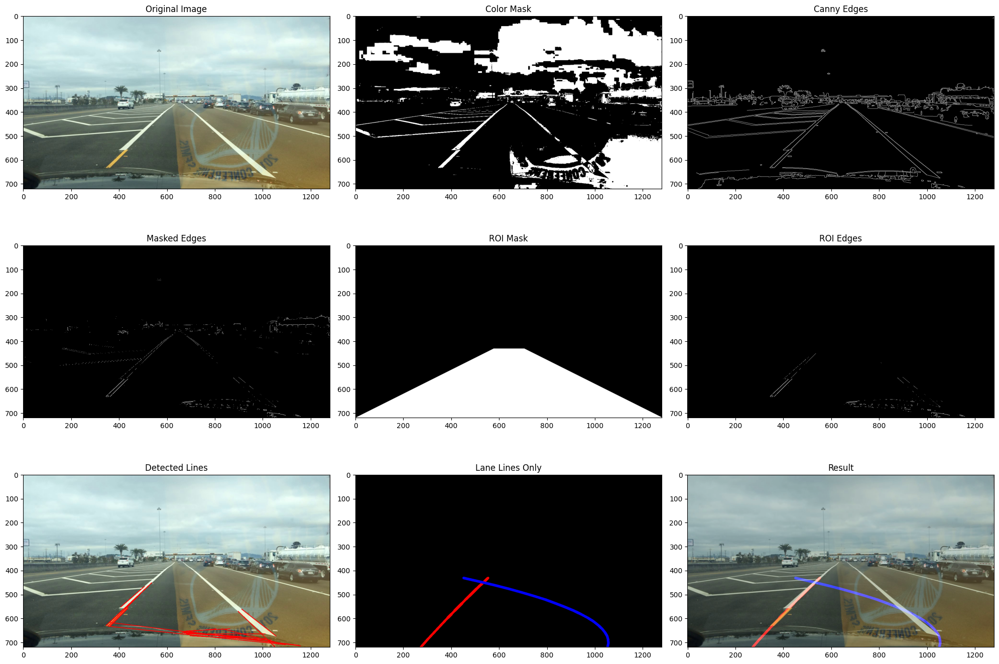

Left lane polynomial coefficients: [ 2.90640745e-04 -1.30486368e+00  1.06268885e+03]
Right lane polynomial coefficients: [-8.43059001e-03  1.17985027e+01 -3.07236190e+03]


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detect_lane_lines(image_path):
    # 读取图像
    img = cv2.imread(image_path)
    if img is None:
        print(f"无法读取图像: {image_path}")
        return None
    
    # 转换为RGB（OpenCV默认使用BGR）
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # 获取图像尺寸
    height, width = img.shape[:2]
    
    # 1. 转换到HSV色彩空间，更容易分离颜色
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    # 2. 创建掩码来筛选黄色和白色（车道线常见颜色）
    # 白色掩码
    lower_white = np.array([0, 0, 200])
    upper_white = np.array([255, 30, 255])
    white_mask = cv2.inRange(hsv, lower_white, upper_white)
    
    # 黄色掩码
    lower_yellow = np.array([20, 100, 100])
    upper_yellow = np.array([30, 255, 255])
    yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)
    
    # 组合掩码
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    
    # 3. 转换为灰度图并进行高斯模糊
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # 4. 应用Canny边缘检测
    edges = cv2.Canny(blur, 50, 150)
    
    # 5. 应用颜色掩码到边缘图像
    masked_edges = cv2.bitwise_and(edges, mask)
    
    # 6. 定义感兴趣区域 (ROI) - 通常是图像的下半部分梯形区域
    roi_vertices = np.array([
        [(0, height), (width*0.45, height*0.6), (width*0.55, height*0.6), (width, height)]
    ], dtype=np.int32)
    
    # 创建ROI掩码
    roi_mask = np.zeros_like(edges)
    cv2.fillPoly(roi_mask, roi_vertices, 255)
    
    # 应用ROI掩码
    roi_edges = cv2.bitwise_and(masked_edges, roi_mask)
    
    # 7. 使用霍夫变换检测直线
    lines = cv2.HoughLinesP(
        roi_edges,
        rho=1,
        theta=np.pi/180,
        threshold=20,
        minLineLength=20,
        maxLineGap=300
    )
    
    # 8. 区分左右车道线
    left_lines = []
    right_lines = []
    
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            
            # 计算斜率
            if x2 - x1 == 0:  # 避免除以零
                continue
                
            slope = (y2 - y1) / (x2 - x1)
            
            # 过滤掉接近水平的线(噪声)
            if abs(slope) < 0.4:
                continue
                
            # 根据斜率划分左右车道线
            if slope < 0:  # 负斜率为左车道线
                left_lines.append(line)
            else:  # 正斜率为右车道线
                right_lines.append(line)
    
    # 9. 拟合左右车道线
    def fit_lane_line(lines):
        if not lines:
            return None
            
        # 提取所有点
        points = np.array([])
        for line in lines:
            x1, y1, x2, y2 = line[0]
            points = np.append(points, [x1, y1, x2, y2])
            
        points = points.reshape(-1, 2)
        
        # 多项式拟合 (二次)
        if len(points) > 0:
            y = points[:, 1]
            x = points[:, 0]
            fit = np.polyfit(y, x, 2)
            return fit
        return None
    
    left_fit = fit_lane_line(left_lines)
    right_fit = fit_lane_line(right_lines)
    
    # 10. 创建用于可视化的图像
    line_image = np.zeros_like(img_rgb)
    
    # 11. 绘制拟合的车道线
    def draw_fitted_line(img, fit, color=(255, 0, 0), thickness=10):
        if fit is None:
            return img
            
        y_points = np.linspace(height*0.6, height, num=20)
        x_points = fit[0]*y_points**2 + fit[1]*y_points + fit[2]
        
        # 将x和y点转换为可画线的格式
        pts = np.vstack((x_points, y_points)).T.astype(np.int32)
        cv2.polylines(img, [pts], False, color, thickness)
        return img
    
    # 绘制左右车道线
    if left_fit is not None:
        line_image = draw_fitted_line(line_image, left_fit, (255, 0, 0), 10)  # 蓝色
    if right_fit is not None:
        line_image = draw_fitted_line(line_image, right_fit, (0, 0, 255), 10)  # 红色
    
    # 叠加车道线到原始图像
    result = cv2.addWeighted(img_rgb, 0.8, line_image, 1, 0)
    
    # 显示中间步骤和结果
    plt.figure(figsize=(20, 14))
    
    plt.subplot(3, 3, 1)
    plt.title('Original Image')
    plt.imshow(img_rgb)
    
    plt.subplot(3, 3, 2)
    plt.title('Color Mask')
    plt.imshow(mask, cmap='gray')
    
    plt.subplot(3, 3, 3)
    plt.title('Canny Edges')
    plt.imshow(edges, cmap='gray')
    
    plt.subplot(3, 3, 4)
    plt.title('Masked Edges')
    plt.imshow(masked_edges, cmap='gray')
    
    plt.subplot(3, 3, 5)
    plt.title('ROI Mask')
    plt.imshow(roi_mask, cmap='gray')
    
    plt.subplot(3, 3, 6)
    plt.title('ROI Edges')
    plt.imshow(roi_edges, cmap='gray')
    
    plt.subplot(3, 3, 7)
    plt.title('Detected Lines')
    line_img = img_rgb.copy()
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(line_img, (x1, y1), (x2, y2), (255, 0, 0), 2)
    plt.imshow(line_img)
    
    plt.subplot(3, 3, 8)
    plt.title('Lane Lines Only')
    plt.imshow(line_image)
    
    plt.subplot(3, 3, 9)
    plt.title('Result')
    plt.imshow(result)
    
    plt.tight_layout()
    plt.show()
    
    return result, left_fit, right_fit

# 使用示例
if __name__ == "__main__":
    # 替换为你的图像路径
    image_path = "/Users/alpha/Downloads/selfRepo/lodcp/docs/t.jpg"
    result, left_fit, right_fit = detect_lane_lines(image_path)
    
    if left_fit is not None:
        print("Left lane polynomial coefficients:", left_fit)
    if right_fit is not None:
        print("Right lane polynomial coefficients:", right_fit)

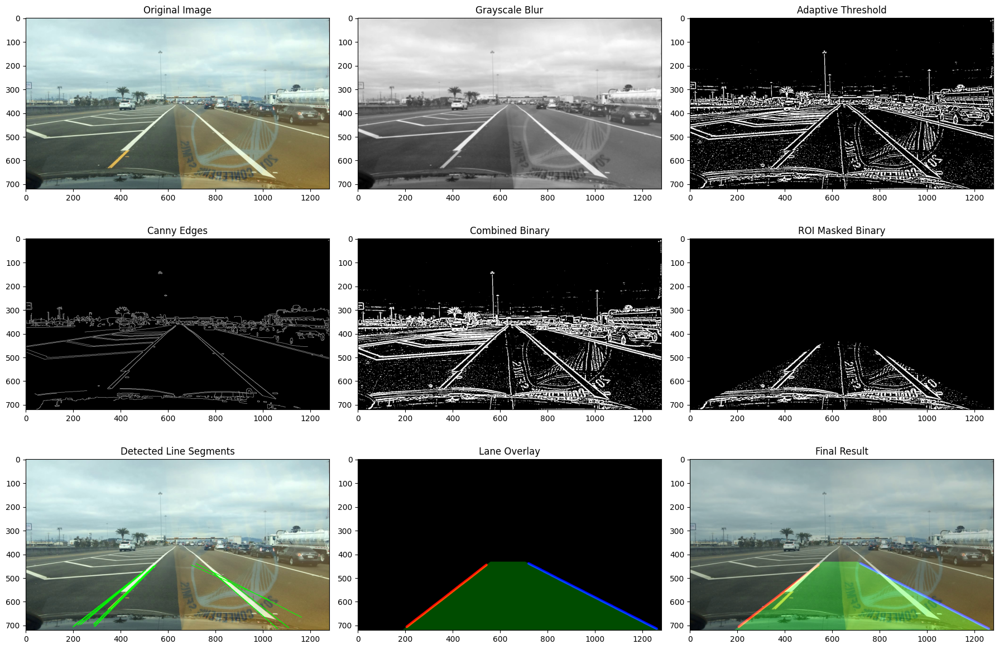

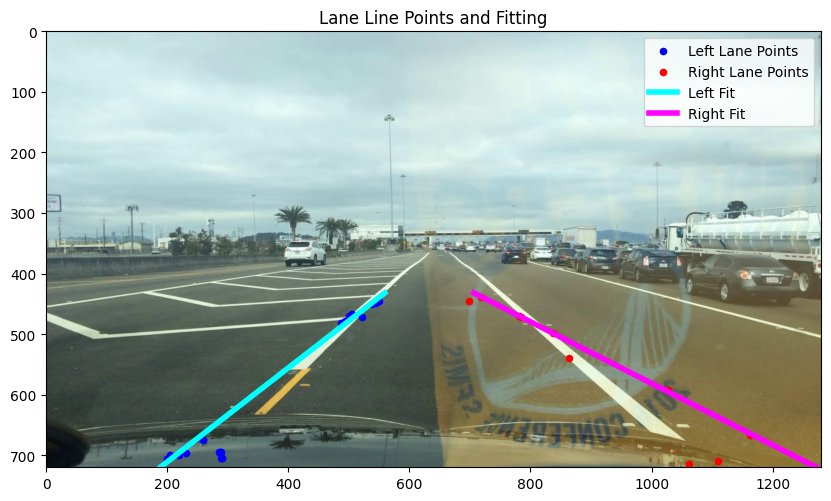

TypeError: unsupported format string passed to numpy.ndarray.__format__

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import RANSACRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

def detect_lane_lines(image_path):
    # 读取图像
    img = cv2.imread(image_path)
    if img is None:
        print(f"无法读取图像: {image_path}")
        return None
    
    # 转换为RGB（OpenCV默认使用BGR）
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    original_img = img_rgb.copy()
    
    # 获取图像尺寸
    height, width = img.shape[:2]
    
    # 1. 转换到灰度图并进行高斯模糊
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # 2. 使用自适应阈值处理，更好地适应不同光照条件
    binary = cv2.adaptiveThreshold(
        blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
        cv2.THRESH_BINARY, 11, 2
    )
    binary = 255 - binary  # 反转，使车道线为白色
    
    # 3. 应用Canny边缘检测
    edges = cv2.Canny(blur, 50, 150)
    
    # 4. 合并二值图和边缘图，增强车道线特征
    combined_binary = cv2.bitwise_or(binary, edges)
    
    # 5. 定义感兴趣区域(ROI)
    roi_vertices = np.array([
        [(0, height), (width*0.45, height*0.6), (width*0.55, height*0.6), (width, height)]
    ], dtype=np.int32)
    
    # 创建ROI掩码
    roi_mask = np.zeros_like(combined_binary)
    cv2.fillPoly(roi_mask, roi_vertices, 255)
    
    # 应用ROI掩码
    roi_binary = cv2.bitwise_and(combined_binary, roi_mask)
    
    # 6. 使用霍夫变换检测直线
    lines = cv2.HoughLinesP(
        roi_binary,
        rho=1,
        theta=np.pi/180,
        threshold=30,
        minLineLength=40,
        maxLineGap=100
    )
    
    # 7. 区分左右车道线
    left_points = []
    right_points = []
    
    # 用于线段可视化
    line_img = img_rgb.copy()
    
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            
            # 计算斜率
            if x2 - x1 == 0:  # 避免除以零
                continue
                
            slope = (y2 - y1) / (x2 - x1)
            
            # 过滤掉接近水平的线(噪声)
            if abs(slope) < 0.4:
                continue
            
            # 过滤掉斜率过大的线(可能是噪声)
            if abs(slope) > 2:
                continue
                
            # 绘制线段用于可视化
            cv2.line(line_img, (x1, y1), (x2, y2), (0, 255, 0), 2)
                
            # 根据斜率划分左右车道线
            # 添加端点坐标而不是完整线条
            if slope < 0:  # 负斜率为左车道线
                left_points.append((x1, y1))
                left_points.append((x2, y2))
            else:  # 正斜率为右车道线
                right_points.append((x1, y1))
                right_points.append((x2, y2))
    
    # 8. 拟合左右车道线 - 使用RANSAC增强鲁棒性
    def fit_lane_line(points, degree=1):
        if len(points) < 4:  # 需要至少有足够的点进行拟合
            return None
            
        # 转换为numpy数组
        points = np.array(points)
        
        # 提取x和y坐标
        x = points[:, 0].reshape(-1, 1)
        y = points[:, 1]
        
        # 使用RANSAC拟合，更鲁棒地处理离群点
        if degree == 1:  # 线性拟合
            ransac = RANSACRegressor(min_samples=2, residual_threshold=15)
            ransac.fit(y.reshape(-1, 1), x)
            slope = ransac.estimator_.coef_[0]
            intercept = ransac.estimator_.intercept_
            return (slope, intercept)
        else:  # 多项式拟合
            model = make_pipeline(
                PolynomialFeatures(degree),
                RANSACRegressor(min_samples=degree+1, residual_threshold=20)
            )
            model.fit(y.reshape(-1, 1), x)
            return model
    
    # 9. 评估拟合质量，选择最佳拟合度
    left_fit = None
    right_fit = None
    
    # 尝试拟合并选择更好的模型
    if len(left_points) >= 4:
        # 尝试线性拟合
        left_linear = fit_lane_line(left_points, degree=1)
        # 在调试中观察拟合情况后决定使用线性还是多项式
        left_fit = left_linear
    
    if len(right_points) >= 4:
        # 尝试线性拟合
        right_linear = fit_lane_line(right_points, degree=1)
        # 在调试中观察拟合情况后决定使用线性还是多项式
        right_fit = right_linear
    
    # 10. 创建用于可视化的图像
    lane_image = np.zeros_like(img_rgb)
    
    # 11. 绘制拟合的车道线
    def draw_fitted_line(img, fit, points, color=(255, 0, 0), thickness=10):
        if fit is None:
            return img
            
        if len(points) == 0:
            return img
            
        # 获取y范围
        min_y = min(p[1] for p in points)
        max_y = max(p[1] for p in points)
        min_y = max(min_y, height * 0.6)  # 不要超出ROI上边界
        
        # 生成y坐标
        y_values = np.linspace(min_y, max_y, num=10).astype(np.int32)
        
        if isinstance(fit, tuple):  # 线性模型
            slope, intercept = fit
            # 计算对应的x坐标
            x_values = (slope * y_values + intercept).astype(np.int32)
        else:  # 多项式模型
            x_values = fit.predict(y_values.reshape(-1, 1)).astype(np.int32)
        
        # 将点集合转换为线条格式
        points_to_draw = np.column_stack((x_values, y_values))
        
        # 绘制线条
        cv2.polylines(img, [points_to_draw], False, color, thickness)
        return img
    
    # 绘制左右车道线
    lane_image = draw_fitted_line(lane_image, left_fit, left_points, (255, 0, 0), 10)  # 蓝色
    lane_image = draw_fitted_line(lane_image, right_fit, right_points, (0, 0, 255), 10)  # 红色
    
    # 突出显示车道线所在区域
    if left_fit is not None and right_fit is not None:
        lane_area = np.zeros_like(img_rgb)
        
        # 获取拟合线的点
        y_values = np.linspace(height*0.6, height, num=20).astype(np.int32)
        
        if isinstance(left_fit, tuple):
            slope, intercept = left_fit
            left_x = (slope * y_values + intercept).astype(np.int32)
        else:
            left_x = left_fit.predict(y_values.reshape(-1, 1)).flatten().astype(np.int32)
            
        if isinstance(right_fit, tuple):
            slope, intercept = right_fit
            right_x = (slope * y_values + intercept).astype(np.int32)
        else:
            right_x = right_fit.predict(y_values.reshape(-1, 1)).flatten().astype(np.int32)
        
        # 创建多边形点集
        lane_pts = np.vstack((
            np.column_stack((left_x, y_values)),
            np.column_stack((right_x[::-1], y_values[::-1]))
        ))
        
        # 填充车道区域
        cv2.fillPoly(lane_area, [lane_pts], (0, 255, 0))  # 绿色半透明
        
        # 添加到结果图像
        lane_image = cv2.addWeighted(lane_image, 1, lane_area, 0.3, 0)
    
    # 将结果叠加到原始图像上
    result = cv2.addWeighted(original_img, 0.8, lane_image, 1, 0)
    
    # 显示中间步骤和结果
    plt.figure(figsize=(18, 12))
    
    plt.subplot(3, 3, 1)
    plt.title('Original Image')
    plt.imshow(original_img)
    
    plt.subplot(3, 3, 2)
    plt.title('Grayscale Blur')
    plt.imshow(blur, cmap='gray')
    
    plt.subplot(3, 3, 3)
    plt.title('Adaptive Threshold')
    plt.imshow(binary, cmap='gray')
    
    plt.subplot(3, 3, 4)
    plt.title('Canny Edges')
    plt.imshow(edges, cmap='gray')
    
    plt.subplot(3, 3, 5)
    plt.title('Combined Binary')
    plt.imshow(combined_binary, cmap='gray')
    
    plt.subplot(3, 3, 6)
    plt.title('ROI Masked Binary')
    plt.imshow(roi_binary, cmap='gray')
    
    plt.subplot(3, 3, 7)
    plt.title('Detected Line Segments')
    plt.imshow(line_img)
    
    plt.subplot(3, 3, 8)
    plt.title('Lane Overlay')
    plt.imshow(lane_image)
    
    plt.subplot(3, 3, 9)
    plt.title('Final Result')
    plt.imshow(result)
    
    plt.tight_layout()
    plt.show()
    
    # 绘制左右车道线点集
    plt.figure(figsize=(10, 6))
    plt.title('Lane Line Points and Fitting')
    
    # 绘制原始图像作为背景
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
    # 绘制左侧点集(蓝色)
    if left_points:
        left_points_array = np.array(left_points)
        plt.scatter(left_points_array[:, 0], left_points_array[:, 1], color='blue', s=20, label='Left Lane Points')
    
    # 绘制右侧点集(红色)
    if right_points:
        right_points_array = np.array(right_points)
        plt.scatter(right_points_array[:, 0], right_points_array[:, 1], color='red', s=20, label='Right Lane Points')
    
    # 绘制拟合线
    if left_fit is not None:
        y_values = np.linspace(height*0.6, height, num=100)
        if isinstance(left_fit, tuple):
            slope, intercept = left_fit
            x_values = slope * y_values + intercept
            plt.plot(x_values, y_values, '-', color='cyan', linewidth=4, label='Left Fit')
    
    if right_fit is not None:
        y_values = np.linspace(height*0.6, height, num=100)
        if isinstance(right_fit, tuple):
            slope, intercept = right_fit
            x_values = slope * y_values + intercept
            plt.plot(x_values, y_values, '-', color='magenta', linewidth=4, label='Right Fit')
    
    plt.legend()
    plt.xlim(0, width)
    plt.ylim(height, 0)  # 反转y轴以匹配图像坐标
    plt.show()
    
    return result, left_fit, right_fit

# 使用示例
if __name__ == "__main__":
    # 替换为你的图像路径
    image_path = "/Users/alpha/Downloads/selfRepo/lodcp/docs/t.jpg"
    result, left_fit, right_fit = detect_lane_lines(image_path)
    
    if left_fit is not None:
        if isinstance(left_fit, tuple):
            slope, intercept = left_fit
            print(f"Left lane: y = {slope:.5f}x + {intercept:.2f}")
        else:
            print("Left lane: 多项式拟合模型")
            
    if right_fit is not None:
        if isinstance(right_fit, tuple):
            slope, intercept = right_fit
            print(f"Right lane: y = {slope:.5f}x + {intercept:.2f}")
        else:
            print("Right lane: 多项式拟合模型")


/var/folders/_v/fs3xptmj3dn2jnsny8lq89_c0000gn/T/ipykernel_83838/1688718148.py:260: UserWarning: Glyph 21407 (\N{CJK UNIFIED IDEOGRAPH-539F}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/_v/fs3xptmj3dn2jnsny8lq89_c0000gn/T/ipykernel_83838/1688718148.py:260: UserWarning: Glyph 22987 (\N{CJK UNIFIED IDEOGRAPH-59CB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/_v/fs3xptmj3dn2jnsny8lq89_c0000gn/T/ipykernel_83838/1688718148.py:260: UserWarning: Glyph 22270 (\N{CJK UNIFIED IDEOGRAPH-56FE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/_v/fs3xptmj3dn2jnsny8lq89_c0000gn/T/ipykernel_83838/1688718148.py:260: UserWarning: Glyph 20687 (\N{CJK UNIFIED IDEOGRAPH-50CF}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/_v/fs3xptmj3dn2jnsny8lq89_c0000gn/T/ipykernel_83838/1688718148.py:260: UserWarning: Glyph 28784 (\N{CJK UNIFIED IDEOGRAPH-7070}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/_v

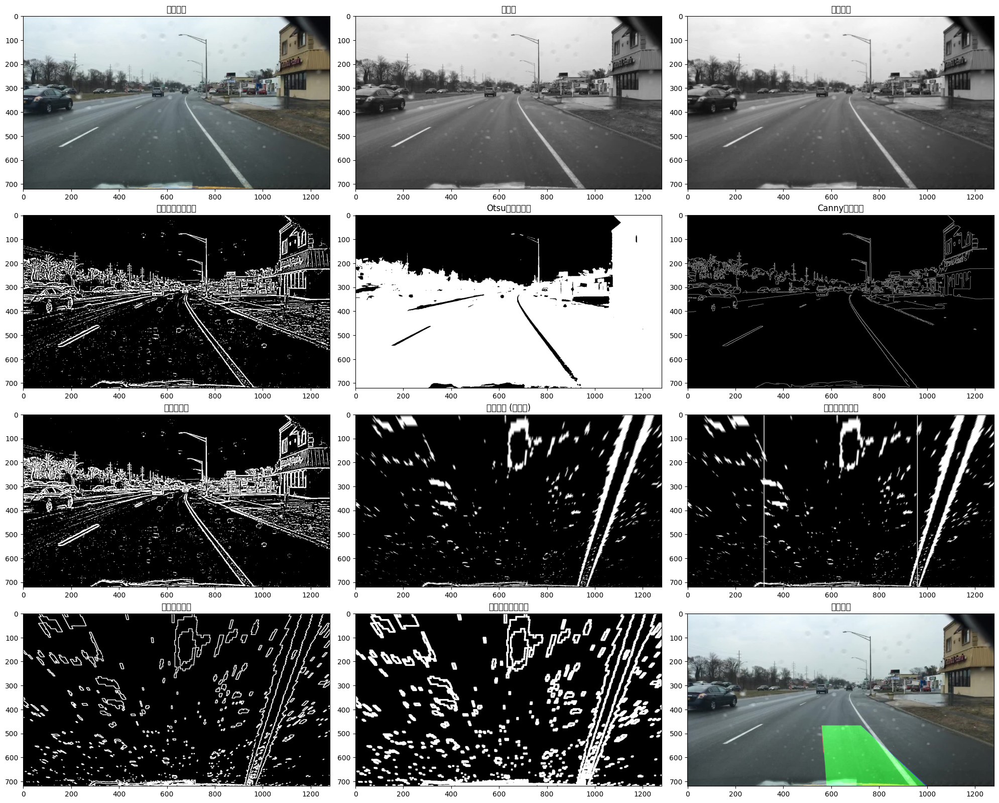

/opt/homebrew/Caskroom/miniconda/base/envs/edit/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 36710 (\N{CJK UNIFIED IDEOGRAPH-8F66}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniconda/base/envs/edit/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 36947 (\N{CJK UNIFIED IDEOGRAPH-9053}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniconda/base/envs/edit/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 32447 (\N{CJK UNIFIED IDEOGRAPH-7EBF}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/miniconda/base/envs/edit/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 36718 (\N{CJK UNIFIED IDEOGRAPH-8F6E}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/homebrew/Caskroom/minic

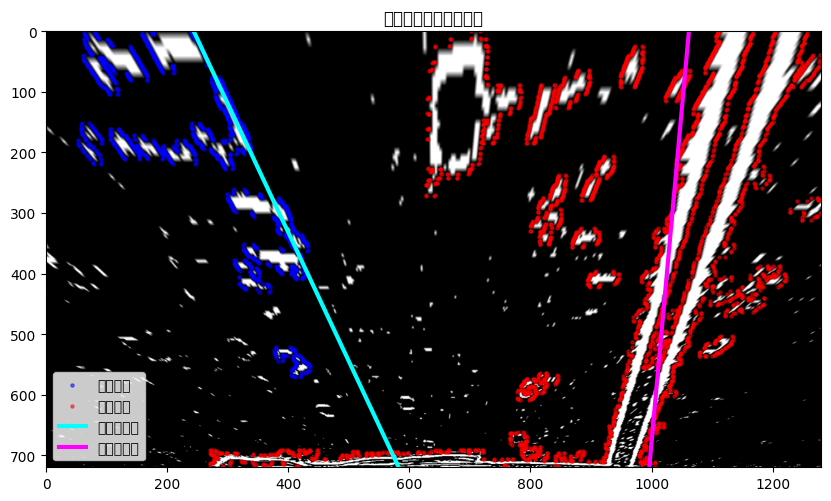

车道线检测完成!
左车道线已拟合
右车道线已拟合


In [94]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import RANSACRegressor

def detect_lane_lines(image_path):
    # 读取图像
    img = cv2.imread(image_path)
    if img is None:
        print(f"无法读取图像: {image_path}")
        return None
    
    # 转换为RGB（OpenCV默认使用BGR）
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    original_img = img_rgb.copy()
    
    # 获取图像尺寸
    height, width = img.shape[:2]
    
    # 1. 颜色空间转换 - 转为灰度图
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # 2. 高斯模糊 - 减少噪声
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # 3. 阈值二值化 - 使用自适应阈值处理
    # 此处使用自适应阈值以应对不同光照条件
    binary_adaptive = cv2.adaptiveThreshold(
        blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
        cv2.THRESH_BINARY_INV, 11, 2
    )
    
    # 同时也尝试全局阈值 - Otsu算法
    _, binary_otsu = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    
    # 4. 边缘检测 - Canny
    edges = cv2.Canny(blur, 50, 150)
    
    # 5. 合并二值化结果和边缘检测结果
    combined_binary = cv2.bitwise_or(binary_adaptive, edges)
    
    # 6. 定义透视变换的源点和目标点 - 假设道路是平面的
    # 源点 - 图像中的梯形区域
    src_points = np.float32([
        [width * 0.4, height * 0.65],  # 左上
        [width * 0.6, height * 0.65],  # 右上
        [width, height],               # 右下
        [0, height]                    # 左下
    ])
    
    # 目标点 - 变换后的矩形区域
    dst_points = np.float32([
        [0, 0],                # 左上
        [width, 0],            # 右上
        [width, height],       # 右下
        [0, height]            # 左下
    ])
    
    # 7. 计算透视变换矩阵
    M = cv2.getPerspectiveTransform(src_points, dst_points)
    Minv = cv2.getPerspectiveTransform(dst_points, src_points)  # 逆变换矩阵(用于后面还原)
    
    # 8. 应用透视变换 - 获取鸟瞰视图
    warped_binary = cv2.warpPerspective(combined_binary, M, (width, height))
    
    # 9. 辅助线框定 - 添加辅助线来帮助框定车道线
    # 创建两个辅助线图像
    auxiliary_lines1 = np.zeros_like(warped_binary)
    auxiliary_lines2 = np.zeros_like(warped_binary)
    
    # 辅助线1 - 第一组辅助线
    cv2.line(auxiliary_lines1, (width//4, 0), (width//4, height), 255, 2)
    cv2.line(auxiliary_lines1, (width*3//4, 0), (width*3//4, height), 255, 2)
    
    # 辅助线2 - 稍微移动的第二组辅助线
    cv2.line(auxiliary_lines2, (width//4 + 10, 0), (width//4 + 10, height), 255, 2)
    cv2.line(auxiliary_lines2, (width*3//4 + 10, 0), (width*3//4 + 10, height), 255, 2)
    
    # 10. 与辅助线进行AND操作
    # 添加辅助线
    warped_with_lines1 = cv2.bitwise_or(warped_binary, auxiliary_lines1)
    warped_with_lines2 = cv2.bitwise_or(warped_binary, auxiliary_lines2)
    
    # 找到轮廓
    contours1, _ = cv2.findContours(warped_with_lines1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours2, _ = cv2.findContours(warped_with_lines2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # 创建轮廓掩码
    contour_mask1 = np.zeros_like(warped_binary)
    contour_mask2 = np.zeros_like(warped_binary)
    
    # 绘制轮廓
    cv2.drawContours(contour_mask1, contours1, -1, 255, 2)
    cv2.drawContours(contour_mask2, contours2, -1, 255, 2)
    
    # 合并两个轮廓掩码 - 通过AND操作消除辅助线
    lane_mask = cv2.bitwise_and(contour_mask1, contour_mask2)
    
    # 11. 膨胀处理 - 连接短线
    kernel = np.ones((5, 5), np.uint8)
    dilated_mask = cv2.dilate(lane_mask, kernel, iterations=1)
    
    # 12. 再次查找轮廓 - 基于膨胀后的掩码
    lane_contours, _ = cv2.findContours(dilated_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # 13. 过滤轮廓 - 根据面积和长宽比
    valid_contours = []
    for contour in lane_contours:
        area = cv2.contourArea(contour)
        if area > 1000:  # 可调整的最小面积阈值
            x, y, w, h = cv2.boundingRect(contour)
            aspect_ratio = float(h) / w
            if 0.1 < aspect_ratio < 10:  # 长宽比范围
                valid_contours.append(contour)
    
    # 14. 将有效轮廓划分为左右车道线
    left_points = []
    right_points = []
    
    for contour in valid_contours:
        # 计算轮廓的中心点
        M = cv2.moments(contour)
        if M["m00"] != 0:
            cx = int(M["m10"] / M["m00"])
            cy = int(M["m01"] / M["m00"])
            
            # 基于中心点x坐标将轮廓分为左右
            if cx < width // 2:
                # 左侧车道线
                for point in contour:
                    left_points.append((point[0][0], point[0][1]))
            else:
                # 右侧车道线
                for point in contour:
                    right_points.append((point[0][0], point[0][1]))
    
    # 15. 使用RANSAC拟合车道线
    def fit_lane_line(points, degree=1):
        if len(points) < 4:
            return None
            
        points = np.array(points)
        x = points[:, 0].reshape(-1, 1)
        y = points[:, 1]
        
        # 使用RANSAC进行鲁棒拟合
        ransac = RANSACRegressor(min_samples=degree+1, residual_threshold=20)
        ransac.fit(y.reshape(-1, 1), x)
        return ransac
    
    # 16. 拟合车道线
    left_fit = fit_lane_line(left_points) if left_points else None
    right_fit = fit_lane_line(right_points) if right_points else None
    
    # 17. 创建车道线可视化图像
    lane_visualization = np.zeros_like(img)
    
    # 18. 绘制拟合的车道线
    def draw_lane_line(img, ransac_model, points, color=(0, 0, 255), thickness=10):
        if ransac_model is None or len(points) == 0:
            return img
        
        # 获取y范围
        points = np.array(points)
        min_y = np.min(points[:, 1])
        max_y = np.max(points[:, 1])
        
        # 生成均匀分布的y值
        y_values = np.linspace(min_y, max_y, 50).astype(np.int32)
        
        # 预测对应的x值
        x_values = ransac_model.predict(y_values.reshape(-1, 1)).flatten().astype(np.int32)
        
        # 组织点集
        pts = np.column_stack((x_values, y_values)).astype(np.int32)
        
        # 绘制线条
        cv2.polylines(img, [pts], False, color, thickness)
        return img
    
    # 绘制左右车道线
    lane_visualization = draw_lane_line(lane_visualization, left_fit, left_points, color=(255, 0, 0), thickness=10)
    lane_visualization = draw_lane_line(lane_visualization, right_fit, right_points, color=(0, 0, 255), thickness=10)
    
    # 19. 填充车道区域
    if left_fit is not None and right_fit is not None:
        # 共同的y值范围
        y_values = np.linspace(0, height-1, 50).astype(np.int32)
        
        # 预测左右车道线的x值
        left_x = left_fit.predict(y_values.reshape(-1, 1)).flatten().astype(np.int32)
        right_x = right_fit.predict(y_values.reshape(-1, 1)).flatten().astype(np.int32)
        
        # 创建多边形点集
        pts = np.vstack([
            np.column_stack((left_x, y_values)),
            np.column_stack((right_x[::-1], y_values[::-1]))
        ])
        
        # 填充车道区域
        cv2.fillPoly(lane_visualization, [pts], (0, 255, 0))
    
    # 20. 将车道可视化从鸟瞰视图转换回原始视角
    lane_unwarped = cv2.warpPerspective(lane_visualization, Minv, (width, height))
    
    # 21. 将车道线叠加到原始图像上
    result = cv2.addWeighted(original_img, 1, lane_unwarped, 0.5, 0)
    
    # 显示处理步骤
    plt.figure(figsize=(20, 16))
    
    plt.subplot(4, 3, 1)
    plt.title('原始图像')
    plt.imshow(original_img)
    
    plt.subplot(4, 3, 2)
    plt.title('灰度图')
    plt.imshow(gray, cmap='gray')
    
    plt.subplot(4, 3, 3)
    plt.title('高斯模糊')
    plt.imshow(blur, cmap='gray')
    
    plt.subplot(4, 3, 4)
    plt.title('自适应阈值二值化')
    plt.imshow(binary_adaptive, cmap='gray')
    
    plt.subplot(4, 3, 5)
    plt.title('Otsu阈值二值化')
    plt.imshow(binary_otsu, cmap='gray')
    
    plt.subplot(4, 3, 6)
    plt.title('Canny边缘检测')
    plt.imshow(edges, cmap='gray')
    
    plt.subplot(4, 3, 7)
    plt.title('合并二值图')
    plt.imshow(combined_binary, cmap='gray')
    
    plt.subplot(4, 3, 8)
    plt.title('透视变换 (鸟瞰图)')
    plt.imshow(warped_binary, cmap='gray')
    
    plt.subplot(4, 3, 9)
    plt.title('带辅助线的图像')
    plt.imshow(warped_with_lines1, cmap='gray')
    
    plt.subplot(4, 3, 10)
    plt.title('合并轮廓掩码')
    plt.imshow(lane_mask, cmap='gray')
    
    plt.subplot(4, 3, 11)
    plt.title('膨胀处理后的掩码')
    plt.imshow(dilated_mask, cmap='gray')
    
    plt.subplot(4, 3, 12)
    plt.title('最终结果')
    plt.imshow(result)
    
    plt.tight_layout()
    plt.show()
    
    # 显示轮廓和拟合线
    plt.figure(figsize=(10, 8))
    plt.title('车道线轮廓和拟合结果')
    
    # 显示原始鸟瞰图作为背景
    plt.imshow(warped_binary, cmap='gray')
    
    # 显示左车道点
    if left_points:
        left_points_array = np.array(left_points)
        plt.scatter(left_points_array[:, 0], left_points_array[:, 1], color='blue', s=5, alpha=0.5, label='左车道点')
    
    # 显示右车道点
    if right_points:
        right_points_array = np.array(right_points)
        plt.scatter(right_points_array[:, 0], right_points_array[:, 1], color='red', s=5, alpha=0.5, label='右车道点')
    
    # 显示拟合线
    if left_fit is not None:
        y_values = np.linspace(0, height-1, 100)
        x_values = left_fit.predict(y_values.reshape(-1, 1)).flatten()
        plt.plot(x_values, y_values, '-', color='cyan', linewidth=3, label='左车道拟合')
    
    if right_fit is not None:
        y_values = np.linspace(0, height-1, 100)
        x_values = right_fit.predict(y_values.reshape(-1, 1)).flatten()
        plt.plot(x_values, y_values, '-', color='magenta', linewidth=3, label='右车道拟合')
    
    plt.legend()
    plt.xlim(0, width)
    plt.ylim(height, 0)  # 反转y轴以匹配图像坐标
    plt.show()
    
    return result, left_fit, right_fit

# 使用示例
if __name__ == "__main__":
    # 替换为你的图像路径
    image_path = "/Users/alpha/Downloads/selfRepo/lodcp/docs/t.jpg"
    result, left_fit, right_fit = detect_lane_lines(image_path)
    
    print("车道线检测完成!")
    if left_fit is not None:
        print("左车道线已拟合")
    else:
        print("未检测到左车道线")
        
    if right_fit is not None:
        print("右车道线已拟合")
    else:
        print("未检测到右车道线")

/var/folders/_v/fs3xptmj3dn2jnsny8lq89_c0000gn/T/ipykernel_83838/1285134968.py:244: UserWarning: Glyph 21407 (\N{CJK UNIFIED IDEOGRAPH-539F}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/_v/fs3xptmj3dn2jnsny8lq89_c0000gn/T/ipykernel_83838/1285134968.py:244: UserWarning: Glyph 22270 (\N{CJK UNIFIED IDEOGRAPH-56FE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/_v/fs3xptmj3dn2jnsny8lq89_c0000gn/T/ipykernel_83838/1285134968.py:244: UserWarning: Glyph 28784 (\N{CJK UNIFIED IDEOGRAPH-7070}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/_v/fs3xptmj3dn2jnsny8lq89_c0000gn/T/ipykernel_83838/1285134968.py:244: UserWarning: Glyph 24230 (\N{CJK UNIFIED IDEOGRAPH-5EA6}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/_v/fs3xptmj3dn2jnsny8lq89_c0000gn/T/ipykernel_83838/1285134968.py:244: UserWarning: Glyph 39640 (\N{CJK UNIFIED IDEOGRAPH-9AD8}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/_v

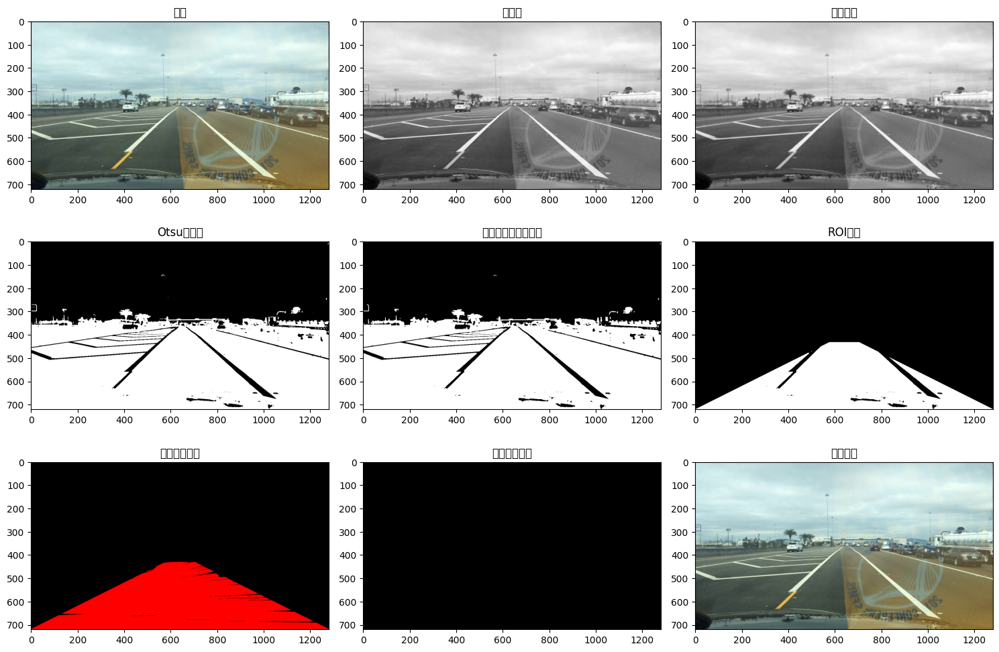

/var/folders/_v/fs3xptmj3dn2jnsny8lq89_c0000gn/T/ipykernel_83838/1285134968.py:282: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


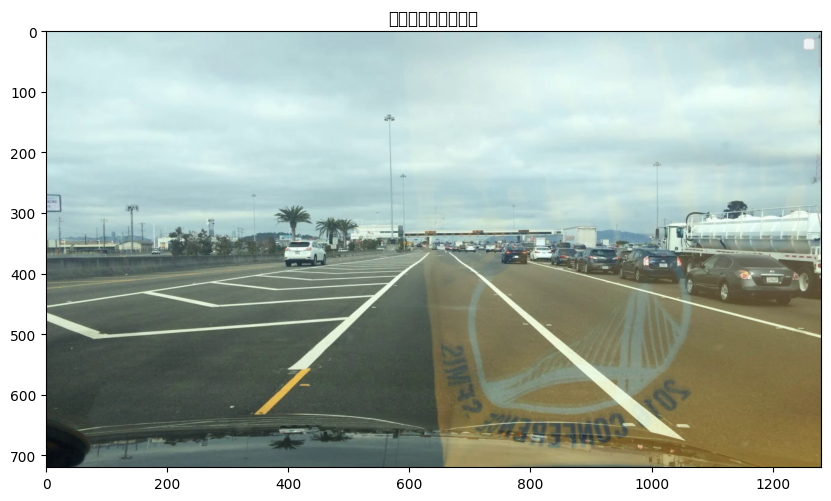

车道线检测完成!


In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import RANSACRegressor

def detect_lane_lines(image_path):
    # 读取图像
    img = cv2.imread(image_path)
    if img is None:
        print(f"无法读取图像: {image_path}")
        return None
    
    # 转换为RGB（OpenCV默认使用BGR）
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    original_img = img_rgb.copy()
    
    # 获取图像尺寸
    height, width = img.shape[:2]
    
    # 1. 颜色空间转换 - 转为灰度图
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # 2. 高斯模糊 - 减少噪声
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # 3. 使用Otsu阈值法二值化
    _, binary_otsu = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    
    # 4. 简单的形态学操作来减少噪点（开操作: 先腐蚀后膨胀）
    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(binary_otsu, cv2.MORPH_OPEN, kernel, iterations=1)
    
    # 5. 定义ROI（感兴趣区域）- 通常是图像的下半部分
    # 创建掩码
    mask = np.zeros_like(opening)
    
    # 定义ROI多边形 - 梯形区域
    roi_corners = np.array([
        [(0, height), (width*0.45, height*0.6), (width*0.55, height*0.6), (width, height)]
    ], dtype=np.int32)
    
    # 填充ROI区域为白色
    cv2.fillPoly(mask, roi_corners, 255)
    
    # 应用ROI掩码
    masked_image = cv2.bitwise_and(opening, mask)
    
    # 6. 霍夫线变换检测直线段
    lines = cv2.HoughLinesP(
        masked_image,
        rho=1,
        theta=np.pi/180,
        threshold=30,
        minLineLength=30,
        maxLineGap=100
    )
    
    # 7. 基于斜率分离左右车道线
    left_lines = []
    right_lines = []
    
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            
            # 避免除以零
            if x2 == x1:
                continue
                
            slope = (y2 - y1) / (x2 - x1)
            
            # 过滤掉近乎水平的线
            if abs(slope) < 0.4:
                continue
                
            # 基于斜率分类
            if slope < 0:  # 负斜率 - 左车道线
                left_lines.append(line)
            else:  # 正斜率 - 右车道线
                right_lines.append(line)
    
    # 8. 准备可视化
    line_image = np.zeros_like(img_rgb)
    
    # 9. 提取左右车道线的所有点
    left_points = []
    right_points = []
    
    # 标记检测到的直线
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(line_image, (x1, y1), (x2, y2), (255, 0, 0), 2)  # 蓝色
    
    # 收集左侧车道线点
    for line in left_lines:
        x1, y1, x2, y2 = line[0]
        left_points.append((x1, y1))
        left_points.append((x2, y2))
        # 绘制左车道线段
        cv2.line(line_image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # 绿色
    
    # 收集右侧车道线点
    for line in right_lines:
        x1, y1, x2, y2 = line[0]
        right_points.append((x1, y1))
        right_points.append((x2, y2))
        # 绘制右车道线段
        cv2.line(line_image, (x1, y1), (x2, y2), (0, 0, 255), 2)  # 红色
    
    # 10. 鲁棒拟合车道线
    def fit_lane_line(points):
        if len(points) < 5:
            return None
            
        points = np.array(points)
        x = points[:, 0]
        y = points[:, 1]
        
        # 按y值排序（从下到上）
        sort_idx = np.argsort(y)
        x = x[sort_idx]
        y = y[sort_idx]
        
        # 计算移动平均以平滑数据（可选）
        window_size = min(5, len(x) // 2) if len(x) > 10 else 1
        if window_size > 1:
            x_smooth = np.convolve(x, np.ones(window_size)/window_size, mode='valid')
            y_smooth = y[window_size-1:]
        else:
            x_smooth = x
            y_smooth = y
        
        # 如果点太少，返回简单的线性拟合
        if len(x_smooth) < 10:
            # 使用numpy的polyfit进行简单线性拟合
            fit = np.polyfit(y_smooth, x_smooth, 1)
            return np.poly1d(fit)
            
        try:
            # 尝试使用RANSAC进行拟合
            ransac = RANSACRegressor(min_samples=5, residual_threshold=15.0, max_trials=1000)
            y_reshaped = y_smooth.reshape(-1, 1)
            ransac.fit(y_reshaped, x_smooth)
            
            # 创建预测函数
            def ransac_predict(y_values):
                return ransac.predict(y_values.reshape(-1, 1))
                
            return ransac_predict
        except Exception as e:
            print(f"RANSAC拟合失败: {e}")
            # 使用传统多项式拟合作为备选
            fit = np.polyfit(y_smooth, x_smooth, 1)
            return np.poly1d(fit)
    
    # 拟合左右车道线
    left_fit_fn = fit_lane_line(left_points) if left_points else None
    right_fit_fn = fit_lane_line(right_points) if right_points else None
    
    # 11. 在整个图像高度范围内绘制拟合曲线
    lane_image = np.zeros_like(img_rgb)
    
    # y值范围（从底部到设定的高度）
    plot_y = np.linspace(height * 0.6, height - 1, num=50).astype(np.int32)
    
    # 绘制左车道线
    if left_fit_fn is not None:
        try:
            plot_x = left_fit_fn(plot_y).astype(np.int32)
            pts_left = np.array([np.transpose(np.vstack([plot_x, plot_y]))])
            cv2.polylines(lane_image, pts_left, isClosed=False, color=(255, 0, 0), thickness=8)
        except Exception as e:
            print(f"绘制左车道线失败: {e}")
    
    # 绘制右车道线
    if right_fit_fn is not None:
        try:
            plot_x = right_fit_fn(plot_y).astype(np.int32)
            pts_right = np.array([np.transpose(np.vstack([plot_x, plot_y]))])
            cv2.polylines(lane_image, pts_right, isClosed=False, color=(0, 0, 255), thickness=8)
        except Exception as e:
            print(f"绘制右车道线失败: {e}")
    
    # 12. 填充车道区域（如果两侧车道线都检测到）
    if left_fit_fn is not None and right_fit_fn is not None:
        try:
            left_plot_x = left_fit_fn(plot_y).astype(np.int32)
            right_plot_x = right_fit_fn(plot_y).astype(np.int32)
            
            # 创建填充多边形的点集
            pts = np.hstack((
                np.array([np.transpose(np.vstack([left_plot_x, plot_y]))]),
                np.array([np.flipud(np.transpose(np.vstack([right_plot_x, plot_y])))])
            ))
            
            # 填充车道区域
            cv2.fillPoly(lane_image, [pts], (0, 255, 0))
        except Exception as e:
            print(f"填充车道区域失败: {e}")
    
    # 13. 将结果叠加到原始图像
    result = cv2.addWeighted(original_img, 1, lane_image, 0.5, 0)
    
    # 14. 可视化处理过程
    plt.figure(figsize=(15, 10))
    
    plt.subplot(3, 3, 1)
    plt.title('原图')
    plt.imshow(original_img)
    
    plt.subplot(3, 3, 2)
    plt.title('灰度图')
    plt.imshow(gray, cmap='gray')
    
    plt.subplot(3, 3, 3)
    plt.title('高斯模糊')
    plt.imshow(blur, cmap='gray')
    
    plt.subplot(3, 3, 4)
    plt.title('Otsu二值化')
    plt.imshow(binary_otsu, cmap='gray')
    
    plt.subplot(3, 3, 5)
    plt.title('开运算（减少噪点）')
    plt.imshow(opening, cmap='gray')
    
    plt.subplot(3, 3, 6)
    plt.title('ROI掩码')
    plt.imshow(masked_image, cmap='gray')
    
    plt.subplot(3, 3, 7)
    plt.title('检测到的线段')
    plt.imshow(line_image)
    
    plt.subplot(3, 3, 8)
    plt.title('拟合的车道线')
    plt.imshow(lane_image)
    
    plt.subplot(3, 3, 9)
    plt.title('最终结果')
    plt.imshow(result)
    
    plt.tight_layout()
    plt.show()
    
    # 15. 绘制拟合点和原始点的对比图
    plt.figure(figsize=(10, 8))
    plt.title('车道线点和拟合结果')
    
    # 显示原图作为背景
    plt.imshow(original_img)
    
    # 绘制左车道点
    if left_points:
        left_points_array = np.array(left_points)
        plt.scatter(left_points_array[:, 0], left_points_array[:, 1], color='yellow', s=10, label='左车道点')
    
    # 绘制右车道点
    if right_points:
        right_points_array = np.array(right_points)
        plt.scatter(right_points_array[:, 0], right_points_array[:, 1], color='cyan', s=10, label='右车道点')
    
    # 绘制左车道线拟合结果
    if left_fit_fn is not None:
        try:
            plot_x = left_fit_fn(plot_y)
            plt.plot(plot_x, plot_y, '-', color='blue', linewidth=3, label='左车道拟合')
        except:
            pass
    
    # 绘制右车道线拟合结果
    if right_fit_fn is not None:
        try:
            plot_x = right_fit_fn(plot_y)
            plt.plot(plot_x, plot_y, '-', color='red', linewidth=3, label='右车道拟合')
        except:
            pass
    
    plt.xlim(0, width)
    plt.ylim(height, 0)  # 反转y轴以匹配图像坐标
    plt.legend()
    plt.show()
    
    return result, left_fit_fn, right_fit_fn

# 使用示例
if __name__ == "__main__":
    # 替换为你的图像路径
    image_path = "/Users/alpha/Downloads/selfRepo/lodcp/docs/t.jpg"
    result, left_fit, right_fit = detect_lane_lines(image_path)
    
    print("车道线检测完成!")

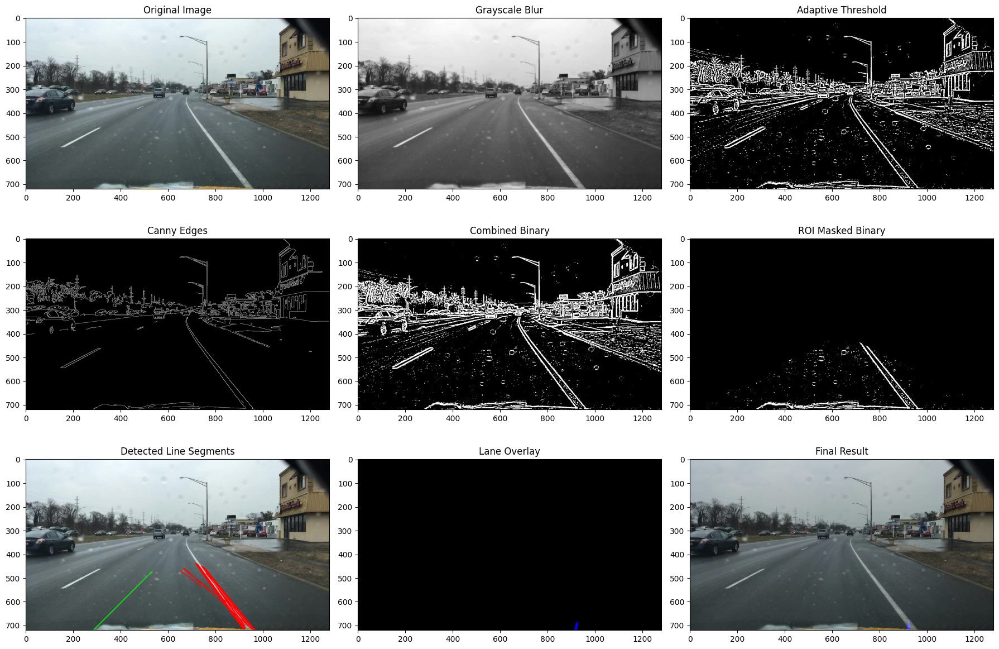

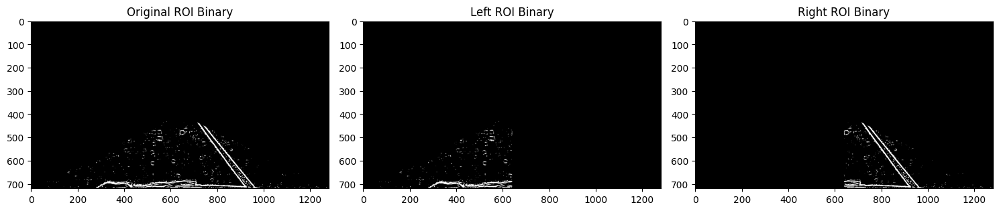

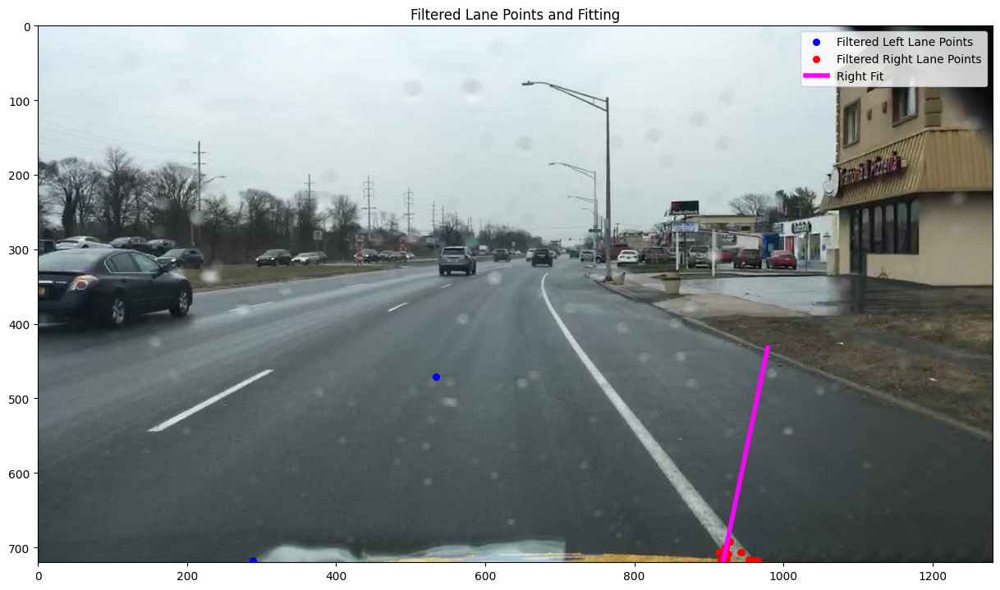

TypeError: unsupported format string passed to numpy.ndarray.__format__

In [95]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import RANSACRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.cluster import DBSCAN

def detect_lane_lines(image_path):
    # 读取图像
    img = cv2.imread(image_path)
    if img is None:
        print(f"无法读取图像: {image_path}")
        return None
    
    # 转换为RGB（OpenCV默认使用BGR）
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    original_img = img_rgb.copy()
    
    # 获取图像尺寸
    height, width = img.shape[:2]
    
    # 1. 转换到灰度图并进行高斯模糊
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # 2. 使用自适应阈值处理，更好地适应不同光照条件
    binary = cv2.adaptiveThreshold(
        blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
        cv2.THRESH_BINARY, 11, 2
    )
    binary = 255 - binary  # 反转，使车道线为白色
    
    # 3. 应用Canny边缘检测
    edges = cv2.Canny(blur, 50, 150)
    
    # 4. 合并二值图和边缘图，增强车道线特征
    combined_binary = cv2.bitwise_or(binary, edges)
    
    # 5. 定义感兴趣区域(ROI)
    roi_vertices = np.array([
        [(0, height), (width*0.45, height*0.6), (width*0.55, height*0.6), (width, height)]
    ], dtype=np.int32)
    
    # 创建ROI掩码
    roi_mask = np.zeros_like(combined_binary)
    cv2.fillPoly(roi_mask, roi_vertices, 255)
    
    # 应用ROI掩码
    roi_binary = cv2.bitwise_and(combined_binary, roi_mask)
    
    # 优化1: 为左右车道创建单独的ROI
    left_roi_vertices = np.array([
        [(0, height), (width*0.45, height*0.6), (width*0.5, height*0.6), (width*0.5, height)]
    ], dtype=np.int32)
    
    right_roi_vertices = np.array([
        [(width*0.5, height), (width*0.5, height*0.6), (width*0.55, height*0.6), (width, height)]
    ], dtype=np.int32)
    
    # 创建左右ROI掩码
    left_roi_mask = np.zeros_like(combined_binary)
    right_roi_mask = np.zeros_like(combined_binary)
    cv2.fillPoly(left_roi_mask, left_roi_vertices, 255)
    cv2.fillPoly(right_roi_mask, right_roi_vertices, 255)
    
    # 应用左右ROI掩码
    left_roi_binary = cv2.bitwise_and(combined_binary, left_roi_mask)
    right_roi_binary = cv2.bitwise_and(combined_binary, right_roi_mask)
    
    # 6. 使用霍夫变换检测直线 (对左右车道分别检测)
    left_lines = cv2.HoughLinesP(
        left_roi_binary,
        rho=1,
        theta=np.pi/180,
        threshold=30,
        minLineLength=40,
        maxLineGap=100
    )
    
    right_lines = cv2.HoughLinesP(
        right_roi_binary,
        rho=1,
        theta=np.pi/180,
        threshold=25,  # 降低阈值以捕获更多右侧线段
        minLineLength=30,
        maxLineGap=100
    )
    
    # 7. 收集左右车道线点
    left_points = []
    right_points = []
    
    # 用于线段可视化
    line_img = img_rgb.copy()
    
    # 处理左侧线段
    if left_lines is not None:
        for line in left_lines:
            x1, y1, x2, y2 = line[0]
            
            # 计算斜率
            if x2 - x1 == 0:  # 避免除以零
                continue
                
            slope = (y2 - y1) / (x2 - x1)
            
            # 更严格的斜率过滤 - 左侧应该是负斜率
            if slope >= -0.5 or slope <= -2:  # 根据实际情况调整范围
                continue
                
            # 确保在左半部分
            if x1 > width * 0.5 or x2 > width * 0.5:
                continue
                
            # 绘制线段用于可视化
            cv2.line(line_img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            
            # 添加端点坐标
            left_points.append((x1, y1))
            left_points.append((x2, y2))
    
    # 处理右侧线段        
    if right_lines is not None:
        for line in right_lines:
            x1, y1, x2, y2 = line[0]
            
            # 计算斜率
            if x2 - x1 == 0:  # 避免除以零
                continue
                
            slope = (y2 - y1) / (x2 - x1)
            
            # 更严格的斜率过滤 - 右侧应该是正斜率
            if slope <= 0.5 or slope >= 2:  # 根据实际情况调整范围
                continue
            
            # 确保在右半部分
            if x1 < width * 0.5 or x2 < width * 0.5:
                continue
                
            # 绘制线段用于可视化
            cv2.line(line_img, (x1, y1), (x2, y2), (255, 0, 0), 2)
            
            # 添加端点坐标
            right_points.append((x1, y1))
            right_points.append((x2, y2))
    
    # 优化2: 使用聚类去除离群点
    def filter_outliers_with_clustering(points):
        if len(points) < 5:
            return points
        
        points_array = np.array(points)
        # 使用DBSCAN聚类
        db = DBSCAN(eps=40, min_samples=3).fit(points_array)
        labels = db.labels_
        
        # 获取最大的聚类
        if len(set(labels)) <= 1:
            return points
        
        # 找出点数最多的聚类
        unique_labels, counts = np.unique(labels, return_counts=True)
        if -1 in unique_labels:  # 删除噪声标签(-1)
            noise_idx = np.where(unique_labels == -1)[0]
            unique_labels = np.delete(unique_labels, noise_idx)
            counts = np.delete(counts, noise_idx)
        
        if len(counts) == 0:
            return points
        
        main_cluster_label = unique_labels[np.argmax(counts)]
        filtered_points = [point for i, point in enumerate(points) if labels[i] == main_cluster_label]
        
        return filtered_points
    
    # 优化3: 使用方差分析进行离群点检测
    def filter_by_variance(points):
        if len(points) < 4:
            return points
        
        points_array = np.array(points)
        x = points_array[:, 0]
        y = points_array[:, 1]
        
        # 初始线性拟合
        z = np.polyfit(y, x, 1)
        p = np.poly1d(z)
        
        # 计算残差
        residuals = x - p(y)
        
        # 计算标准差
        std_dev = np.std(residuals)
        
        # 移除偏离过大的点(例如2个标准差)
        filtered_points = [points[i] for i in range(len(points)) if abs(residuals[i]) < 2 * std_dev]
        
        return filtered_points
    
    # 优化4: 基于位置的过滤
    def filter_by_position(points, is_right_lane, width, height):
        filtered_points = []
        for x, y in points:
            if is_right_lane:
                # 给右车道线的位置添加约束
                if x < width * 0.5:  # 过滤掉左侧的点
                    continue
                
                # 过滤顶部的异常点
                if y < height * 0.65 and x < width * 0.6:
                    continue
            else:
                # 给左车道线的位置添加约束
                if x > width * 0.5:  # 过滤掉右侧的点
                    continue
                
                # 过滤顶部的异常点
                if y < height * 0.65 and x > width * 0.4:
                    continue
                
            filtered_points.append((x, y))
        
        return filtered_points
    
    # 应用过滤方法
    # 首先按位置过滤
    left_points = filter_by_position(left_points, False, width, height)
    right_points = filter_by_position(right_points, True, width, height)
    
    # 然后使用聚类过滤
    left_points = filter_outliers_with_clustering(left_points)
    right_points = filter_outliers_with_clustering(right_points)
    
    # 最后用方差分析进一步优化
    left_points = filter_by_variance(left_points)
    right_points = filter_by_variance(right_points)
    
    # 8. 拟合左右车道线 - 使用RANSAC增强鲁棒性
    def fit_lane_line(points, degree=1):
        if len(points) < 4:  # 需要至少有足够的点进行拟合
            return None
            
        # 转换为numpy数组
        points = np.array(points)
        
        # 提取x和y坐标
        x = points[:, 0].reshape(-1, 1)
        y = points[:, 1]
        
        # 使用RANSAC拟合，更鲁棒地处理离群点
        if degree == 1:  # 线性拟合
            ransac = RANSACRegressor(
                min_samples=3, 
                residual_threshold=10,  # 更严格的阈值
                max_trials=200,         # 更多的迭代尝试
                random_state=42
            )
            ransac.fit(y.reshape(-1, 1), x)
            slope = ransac.estimator_.coef_[0]
            intercept = ransac.estimator_.intercept_
            return (slope, intercept)
        else:  # 多项式拟合
            model = make_pipeline(
                PolynomialFeatures(degree),
                RANSACRegressor(
                    min_samples=degree+1, 
                    residual_threshold=15, 
                    max_trials=200,
                    random_state=42
                )
            )
            model.fit(y.reshape(-1, 1), x)
            return model
    
    # 9. 评估拟合质量，选择最佳拟合度
    left_fit = None
    right_fit = None
    
    # 尝试拟合并选择更好的模型
    if len(left_points) >= 4:
        # 尝试线性拟合
        left_linear = fit_lane_line(left_points, degree=1)
        # 在调试中观察拟合情况后决定使用线性还是多项式
        left_fit = left_linear
    
    if len(right_points) >= 4:
        # 尝试线性拟合
        right_linear = fit_lane_line(right_points, degree=1)
        # 在调试中观察拟合情况后决定使用线性还是多项式
        right_fit = right_linear
    
    # 10. 创建用于可视化的图像
    lane_image = np.zeros_like(img_rgb)
    
    # 11. 绘制拟合的车道线
    def draw_fitted_line(img, fit, points, color=(255, 0, 0), thickness=10):
        if fit is None:
            return img
            
        if len(points) == 0:
            return img
            
        # 获取y范围
        min_y = min(p[1] for p in points)
        max_y = max(p[1] for p in points)
        min_y = max(min_y, height * 0.6)  # 不要超出ROI上边界
        
        # 生成y坐标
        y_values = np.linspace(min_y, max_y, num=10).astype(np.int32)
        
        if isinstance(fit, tuple):  # 线性模型
            slope, intercept = fit
            # 计算对应的x坐标
            x_values = (slope * y_values + intercept).astype(np.int32)
        else:  # 多项式模型
            x_values = fit.predict(y_values.reshape(-1, 1)).astype(np.int32)
        
        # 将点集合转换为线条格式
        points_to_draw = np.column_stack((x_values, y_values))
        
        # 绘制线条
        cv2.polylines(img, [points_to_draw], False, color, thickness)
        return img
    
    # 绘制左右车道线
    lane_image = draw_fitted_line(lane_image, left_fit, left_points, (255, 0, 0), 10)  # 蓝色
    lane_image = draw_fitted_line(lane_image, right_fit, right_points, (0, 0, 255), 10)  # 红色
    
    # 突出显示车道线所在区域
    if left_fit is not None and right_fit is not None:
        lane_area = np.zeros_like(img_rgb)
        
        # 获取拟合线的点
        y_values = np.linspace(height*0.6, height, num=20).astype(np.int32)
        
        if isinstance(left_fit, tuple):
            slope, intercept = left_fit
            left_x = (slope * y_values + intercept).astype(np.int32)
        else:
            left_x = left_fit.predict(y_values.reshape(-1, 1)).flatten().astype(np.int32)
            
        if isinstance(right_fit, tuple):
            slope, intercept = right_fit
            right_x = (slope * y_values + intercept).astype(np.int32)
        else:
            right_x = right_fit.predict(y_values.reshape(-1, 1)).flatten().astype(np.int32)
        
        # 创建多边形点集
        lane_pts = np.vstack((
            np.column_stack((left_x, y_values)),
            np.column_stack((right_x[::-1], y_values[::-1]))
        ))
        
        # 填充车道区域
        cv2.fillPoly(lane_area, [lane_pts], (0, 255, 0))  # 绿色半透明
        
        # 添加到结果图像
        lane_image = cv2.addWeighted(lane_image, 1, lane_area, 0.3, 0)
    
    # 将结果叠加到原始图像上
    result = cv2.addWeighted(original_img, 0.8, lane_image, 1, 0)
    
    # 显示中间步骤和结果
    plt.figure(figsize=(18, 12))
    
    plt.subplot(3, 3, 1)
    plt.title('Original Image')
    plt.imshow(original_img)
    
    plt.subplot(3, 3, 2)
    plt.title('Grayscale Blur')
    plt.imshow(blur, cmap='gray')
    
    plt.subplot(3, 3, 3)
    plt.title('Adaptive Threshold')
    plt.imshow(binary, cmap='gray')
    
    plt.subplot(3, 3, 4)
    plt.title('Canny Edges')
    plt.imshow(edges, cmap='gray')
    
    plt.subplot(3, 3, 5)
    plt.title('Combined Binary')
    plt.imshow(combined_binary, cmap='gray')
    
    plt.subplot(3, 3, 6)
    plt.title('ROI Masked Binary')
    plt.imshow(roi_binary, cmap='gray')
    
    plt.subplot(3, 3, 7)
    plt.title('Detected Line Segments')
    plt.imshow(line_img)
    
    plt.subplot(3, 3, 8)
    plt.title('Lane Overlay')
    plt.imshow(lane_image)
    
    plt.subplot(3, 3, 9)
    plt.title('Final Result')
    plt.imshow(result)
    
    plt.tight_layout()
    plt.show()
    
    # 显示左右ROI的效果
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.title('Original ROI Binary')
    plt.imshow(roi_binary, cmap='gray')
    
    plt.subplot(1, 3, 2)
    plt.title('Left ROI Binary')
    plt.imshow(left_roi_binary, cmap='gray')
    
    plt.subplot(1, 3, 3)
    plt.title('Right ROI Binary')
    plt.imshow(right_roi_binary, cmap='gray')
    
    plt.tight_layout()
    plt.show()
    
    # 绘制左右车道线点集(过滤前后对比)
    plt.figure(figsize=(15, 10))
    
    # 绘制原始图像作为背景
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    
    # 左侧点集
    if left_points:
        left_points_array = np.array(left_points)
        plt.scatter(left_points_array[:, 0], left_points_array[:, 1], color='blue', s=30, label='Filtered Left Lane Points')
    
    # 右侧点集
    if right_points:
        right_points_array = np.array(right_points)
        plt.scatter(right_points_array[:, 0], right_points_array[:, 1], color='red', s=30, label='Filtered Right Lane Points')
    
    # 绘制拟合线
    if left_fit is not None:
        y_values = np.linspace(height*0.6, height, num=100)
        if isinstance(left_fit, tuple):
            slope, intercept = left_fit
            x_values = slope * y_values + intercept
            plt.plot(x_values, y_values, '-', color='cyan', linewidth=4, label='Left Fit')
    
    if right_fit is not None:
        y_values = np.linspace(height*0.6, height, num=100)
        if isinstance(right_fit, tuple):
            slope, intercept = right_fit
            x_values = slope * y_values + intercept
            plt.plot(x_values, y_values, '-', color='magenta', linewidth=4, label='Right Fit')
    
    plt.legend()
    plt.xlim(0, width)
    plt.ylim(height, 0)  # 反转y轴以匹配图像坐标
    plt.title('Filtered Lane Points and Fitting')
    plt.show()
    
    return result, left_fit, right_fit

# 使用示例
if __name__ == "__main__":
    # 替换为你的图像路径
    image_path = "/Users/alpha/Downloads/selfRepo/lodcp/docs/t.jpg"
    result, left_fit, right_fit = detect_lane_lines(image_path)
    
    if left_fit is not None:
        if isinstance(left_fit, tuple):
            slope, intercept = left_fit
            print(f"Left lane: y = {slope:.5f}x + {intercept:.2f}")
        else:
            print("Left lane: 多项式拟合模型")
            
    if right_fit is not None:
        if isinstance(right_fit, tuple):
            slope, intercept = right_fit
            print(f"Right lane: y = {slope:.5f}x + {intercept:.2f}")
        else:
            print("Right lane: 多项式拟合模型")

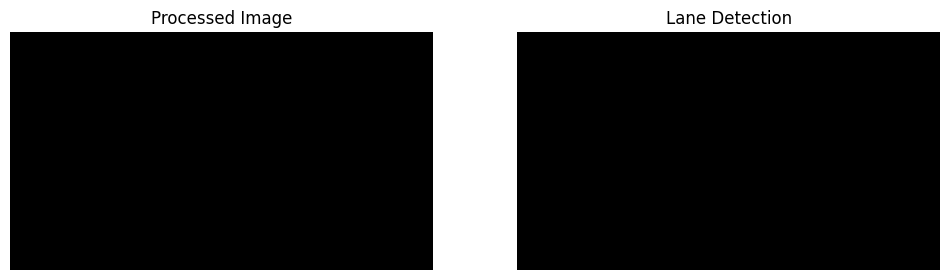

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


# 使用Sobel算子求导， 对每个通道进行卷积，获取边缘信息
def apply_sobel(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    sobel_magnitude = cv2.magnitude(sobel_x, sobel_y)
    sobel_magnitude = cv2.convertScaleAbs(sobel_magnitude)
    return sobel_magnitude

# 阈值过滤 和 透视变换
def threshold_and_perspective_transform(image):
    # 阈值过滤
    _, binary = cv2.threshold(image, 50, 255, cv2.THRESH_BINARY)
    
    # 定义透视变换的源点和目标点
    height, width = image.shape[:2]
    src_points = np.float32([
        [width * 0.4, height * 0.65],
        [width * 0.6, height * 0.65],
        [width, height],
        [0, height]
    ])
    dst_points = np.float32([
        [0, 0],
        [width, 0],
        [width, height],
        [0, height]
    ])
    
    # 透视变换
    M = cv2.getPerspectiveTransform(src_points, dst_points)
    warped = cv2.warpPerspective(binary, M, (width, height))
    return warped

# 生成一张带有横线辅助图
def generate_auxiliary_lines(image):
    height, width = image.shape[:2]
    auxiliary_image = np.zeros_like(image)
    for y in range(50, height, 50):
        cv2.line(auxiliary_image, (0, y), (width, y), 255, 1)
    return auxiliary_image

# 多项式拟合
def fit_polynomial(coeffs, image):
    h, w = image.shape[:2]
    y = np.linspace(0, h - 1, h)
    x = np.polyval(coeffs, y)
    x = np.clip(x, 0, w - 1).astype(np.int32)
    for i in range(len(y) - 1):
        cv2.line(image, (x[i], int(y[i])), (x[i + 1], int(y[i + 1])), (0, 255, 0), 2)
    return image

# 加载图像
image_path = "/Users/alpha/Downloads/selfRepo/lodcp/docs/t.jpg"
image = cv2.imread(image_path)

# 使用Sobel算子获取边缘信息
sobel_edges = apply_sobel(image)

# 阈值过滤和透视变换
warped = threshold_and_perspective_transform(sobel_edges)

# 生成带有横线辅助图
auxiliary_lines = generate_auxiliary_lines(warped)

# 将横线移动生成图，再与辅助图执行and操作
shifted_lines = np.roll(auxiliary_lines, 10, axis=0)
processed = cv2.bitwise_and(auxiliary_lines, shifted_lines)

# 形态学处理
kernel = np.ones((5, 5), np.uint8)
processed = cv2.morphologyEx(processed, cv2.MORPH_CLOSE, kernel)

# 多项式拟合并绘制车道线
result_with_lane = fit_polynomial(coeffs, processed)

# 显示结果
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Processed Image")
plt.imshow(processed, cmap="gray")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Lane Detection")
plt.imshow(result_with_lane, cmap="gray")
plt.axis("off")
plt.show()


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detect_lane_lines(image_path):
    # 读取图像
    img = cv2.imread(image_path)
    if img is None:
        print(f"无法读取图像: {image_path}")
        return None
    
    # 转换为RGB（OpenCV默认使用BGR）
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # 获取图像尺寸
    height, width = img.shape[:2]
    
    # 1. 转换到HSV色彩空间，更容易分离颜色
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    # 2. 创建掩码来筛选黄色和白色（车道线常见颜色）
    # 白色掩码
    lower_white = np.array([0, 0, 200])
    upper_white = np.array([255, 30, 255])
    white_mask = cv2.inRange(hsv, lower_white, upper_white)
    
    # 黄色掩码
    lower_yellow = np.array([20, 100, 100])
    upper_yellow = np.array([30, 255, 255])
    yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)
    
    # 组合掩码
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    
    # 3. 转换为灰度图并进行高斯模糊
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    
    # 4. 应用Canny边缘检测
    edges = cv2.Canny(blur, 50, 150)
    
    # 5. 应用颜色掩码到边缘图像
    masked_edges = cv2.bitwise_and(edges, mask)
    
    # 6. 定义感兴趣区域 (ROI) - 通常是图像的下半部分梯形区域
    roi_vertices = np.array([
        [(0, height), (width*0.45, height*0.6), (width*0.55, height*0.6), (width, height)]
    ], dtype=np.int32)
    
    # 创建ROI掩码
    roi_mask = np.zeros_like(edges)
    cv2.fillPoly(roi_mask, roi_vertices, 255)
    
    # 应用ROI掩码
    roi_edges = cv2.bitwise_and(masked_edges, roi_mask)
    
    # 7. 使用霍夫变换检测直线
    lines = cv2.HoughLinesP(
        roi_edges,
        rho=1,
        theta=np.pi/180,
        threshold=20,
        minLineLength=20,
        maxLineGap=300
    )
    
    # 8. 区分左右车道线
    left_lines = []
    right_lines = []
    
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            
            # 计算斜率
            if x2 - x1 == 0:  # 避免除以零
                continue
                
            slope = (y2 - y1) / (x2 - x1)
            
            # 过滤掉接近水平的线(噪声)
            if abs(slope) < 0.4:
                continue
                
            # 根据斜率划分左右车道线
            if slope < 0:  # 负斜率为左车道线
                left_lines.append(line)
            else:  # 正斜率为右车道线
                right_lines.append(line)
    
    # 9. 拟合左右车道线
    def fit_lane_line(lines):
        if not lines:
            return None
            
        # 提取所有点
        points = np.array([])
        for line in lines:
            x1, y1, x2, y2 = line[0]
            points = np.append(points, [x1, y1, x2, y2])
            
        points = points.reshape(-1, 2)
        
        # 多项式拟合 (二次)
        if len(points) > 0:
            y = points[:, 1]
            x = points[:, 0]
            fit = np.polyfit(y, x, 2)
            return fit
        return None
    
    left_fit = fit_lane_line(left_lines)
    right_fit = fit_lane_line(right_lines)
    
    # 10. 创建用于可视化的图像
    line_image = np.zeros_like(img_rgb)
    
    # 11. 绘制拟合的车道线
    def draw_fitted_line(img, fit, color=(255, 0, 0), thickness=10):
        if fit is None:
            return img
            
        y_points = np.linspace(height*0.6, height, num=20)
        x_points = fit[0]*y_points**2 + fit[1]*y_points + fit[2]
        
        # 将x和y点转换为可画线的格式
        pts = np.vstack((x_points, y_points)).T.astype(np.int32)
        cv2.polylines(img, [pts], False, color, thickness)
        return img
    
    # 绘制左右车道线
    if left_fit is not None:
        line_image = draw_fitted_line(line_image, left_fit, (255, 0, 0), 10)  # 蓝色
    if right_fit is not None:
        line_image = draw_fitted_line(line_image, right_fit, (0, 0, 255), 10)  # 红色
    
    # 叠加车道线到原始图像
    result = cv2.addWeighted(img_rgb, 0.8, line_image, 1, 0)
    
    # 显示中间步骤和结果
    plt.figure(figsize=(20, 14))
    
    plt.subplot(3, 3, 1)
    plt.title('Original Image')
    plt.imshow(img_rgb)
    
    plt.subplot(3, 3, 2)
    plt.title('Color Mask')
    plt.imshow(mask, cmap='gray')
    
    plt.subplot(3, 3, 3)
    plt.title('Canny Edges')
    plt.imshow(edges, cmap='gray')
    
    plt.subplot(3, 3, 4)
    plt.title('Masked Edges')
    plt.imshow(masked_edges, cmap='gray')
    
    plt.subplot(3, 3, 5)
    plt.title('ROI Mask')
    plt.imshow(roi_mask, cmap='gray')
    
    plt.subplot(3, 3, 6)
    plt.title('ROI Edges')
    plt.imshow(roi_edges, cmap='gray')
    
    plt.subplot(3, 3, 7)
    plt.title('Detected Lines')
    line_img = img_rgb.copy()
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(line_img, (x1, y1), (x2, y2), (255, 0, 0), 2)
    plt.imshow(line_img)
    
    plt.subplot(3, 3, 8)
    plt.title('Lane Lines Only')
    plt.imshow(line_image)
    
    plt.subplot(3, 3, 9)
    plt.title('Result')
    plt.imshow(result)
    
    plt.tight_layout()
    plt.show()
    
    return result, left_fit, right_fit

# 使用示例
if __name__ == "__main__":
    # 替换为你的图像路径
    image_path = "/Users/alpha/Downloads/selfRepo/lodcp/docs/t.jpg"
    result, left_fit, right_fit = detect_lane_lines(image_path)
    
    if left_fit is not None:
        print("Left lane polynomial coefficients:", left_fit)
    if right_fit is not None:
        print("Right lane polynomial coefficients:", right_fit)

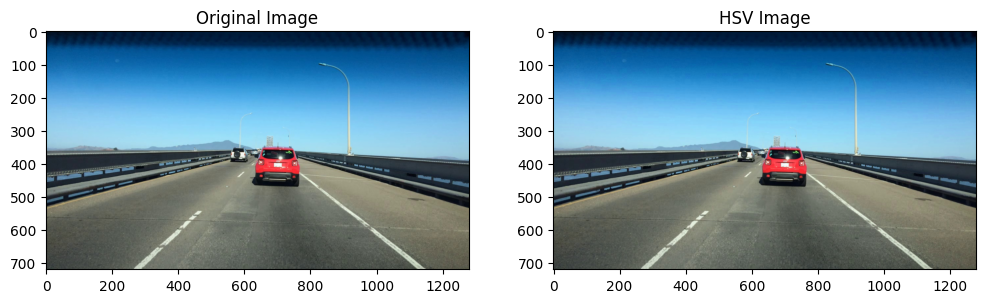

开始创建掩码


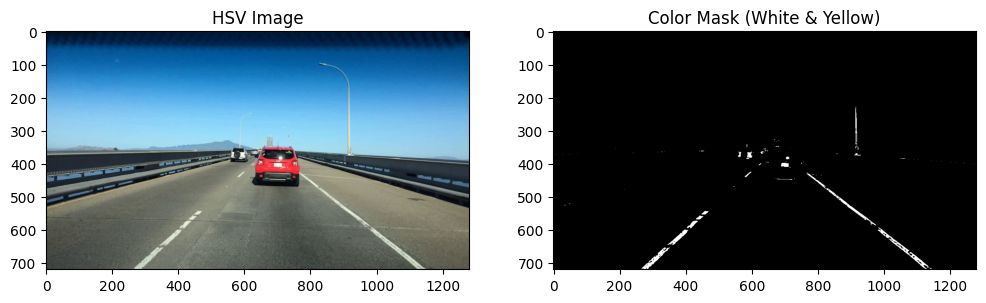

开始LoG处理


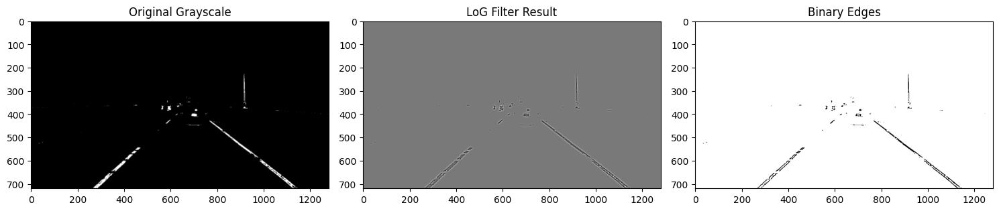

开始多尺度DoG处理


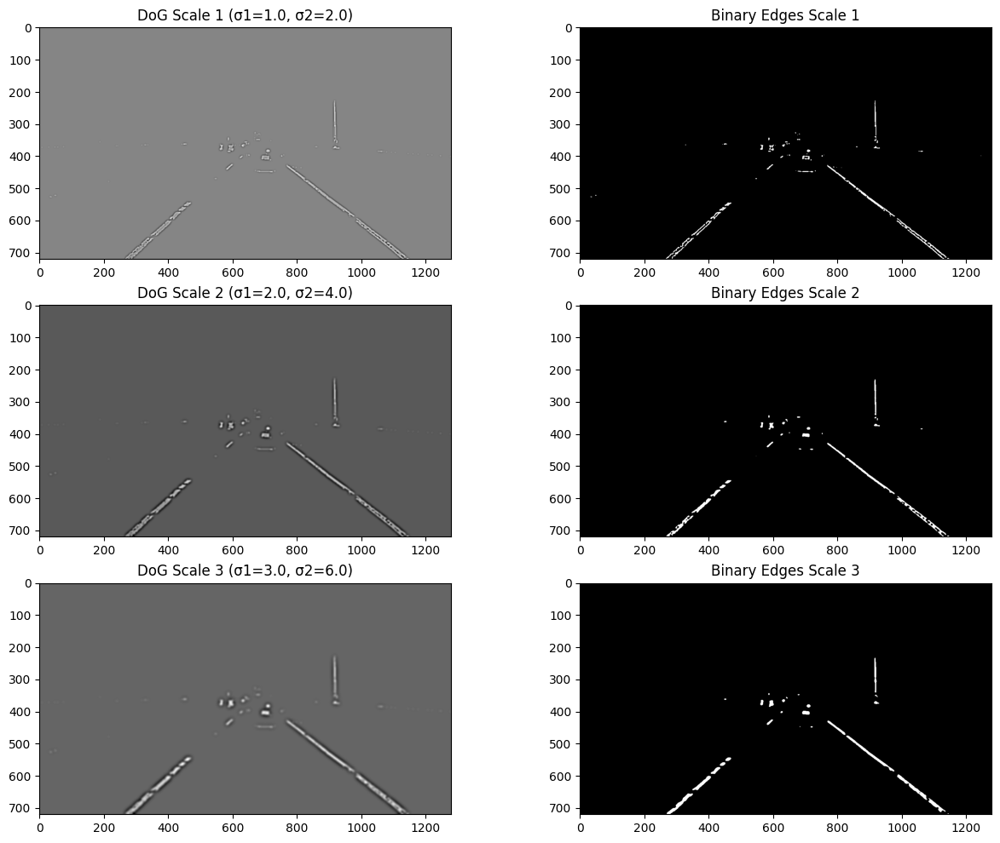

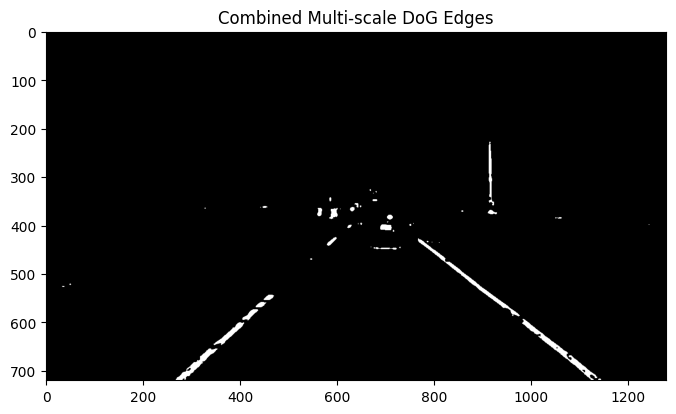

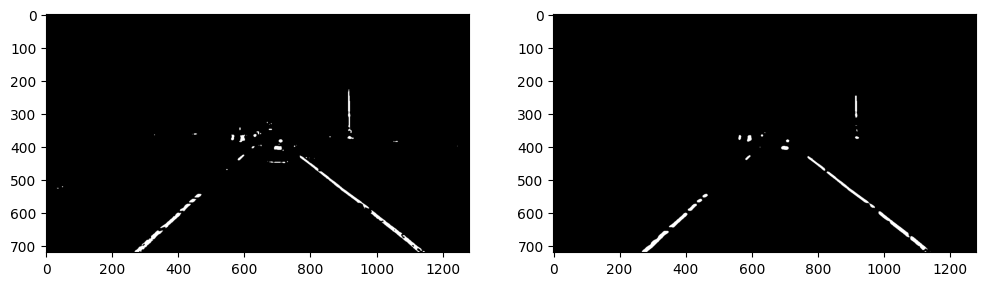

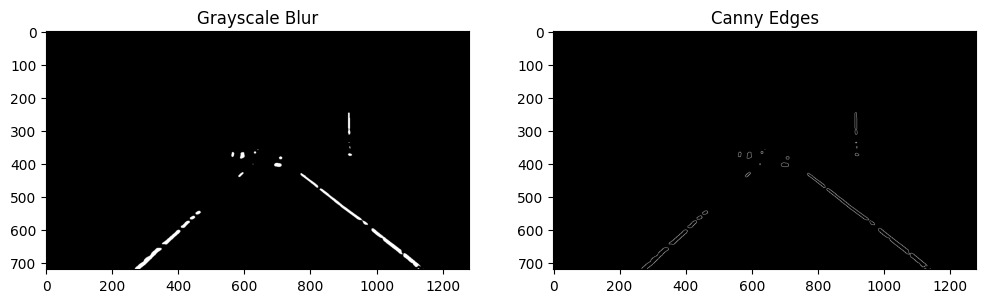

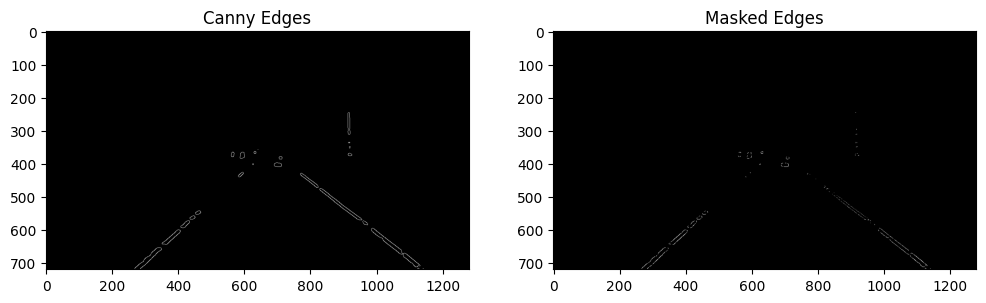

...

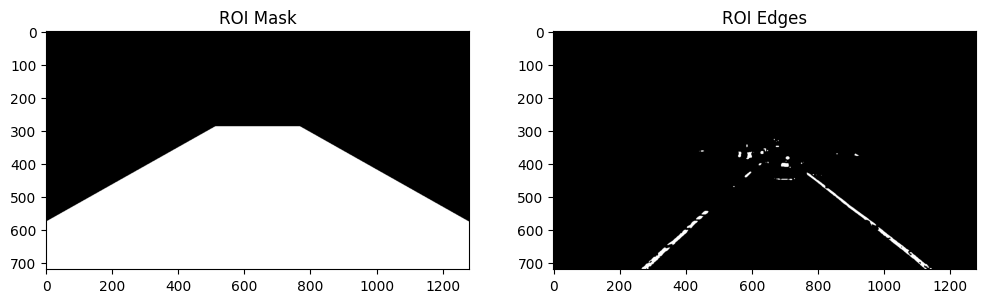

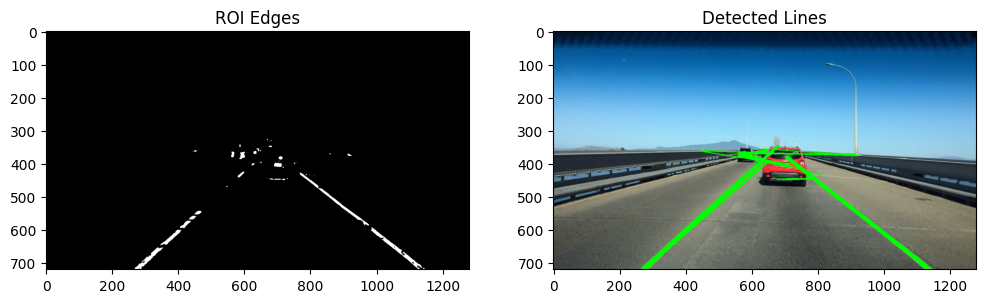

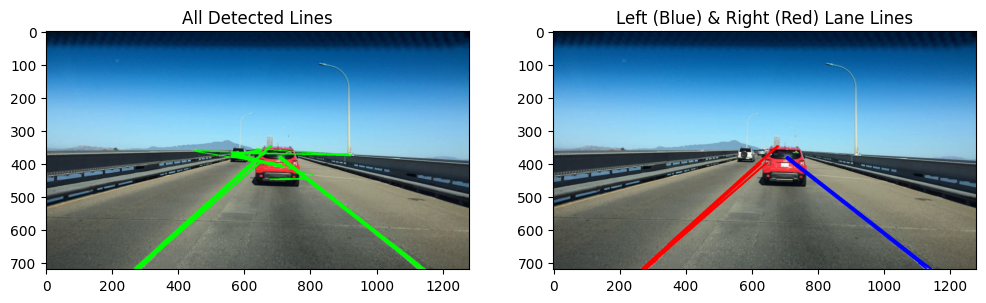

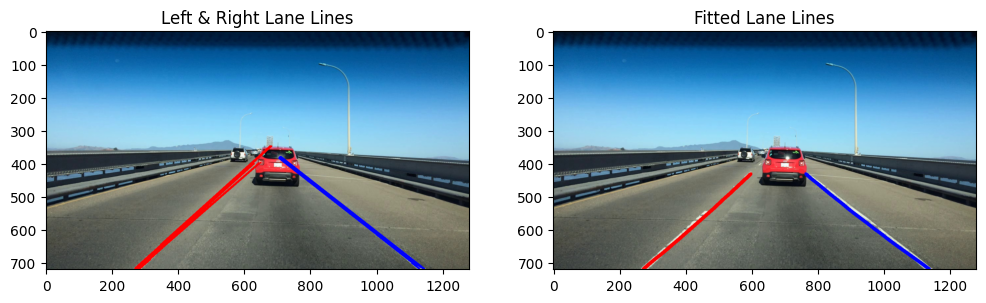

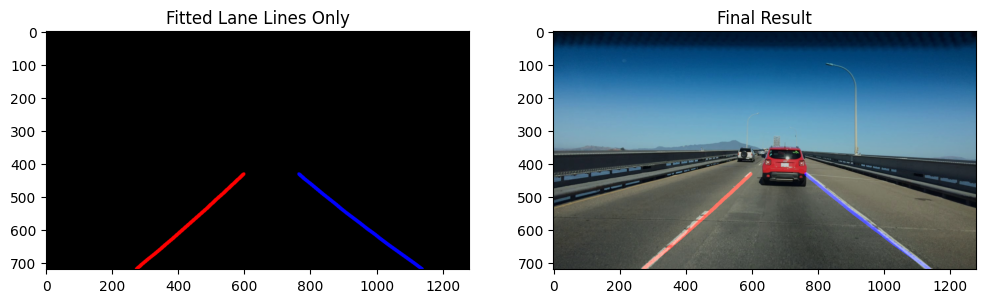

Left lane polynomial coefficients: [-3.28996282e-04 -7.49110956e-01  9.83098930e+02]
Right lane polynomial coefficients: [4.18024788e-04 8.16239685e-01 3.34377982e+02]


In [96]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
def enhance_lane_edges(edges, gray):
    # 1. 创建各种内核大小
    kernel_small = np.ones((3, 3), np.uint8)
    kernel_medium = np.ones((5, 5), np.uint8)
    kernel_large = np.ones((15, 15), np.uint8)
    
    # 2. 应用顶帽运算提取亮细节（直接在灰度图上操作）
    tophat = cv2.morphologyEx(gray, cv2.MORPH_TOPHAT, kernel_large)
    
    # 3. 增强边缘对比度并二值化
    _, enhanced_edges = cv2.threshold(edges, 100, 255, cv2.THRESH_BINARY)
    
    # 4. 应用闭运算连接断开的线
    closed_edges = cv2.morphologyEx(enhanced_edges, cv2.MORPH_CLOSE, kernel_medium)
    
    # 5. 应用开运算去除噪点
    opened_edges = cv2.morphologyEx(closed_edges, cv2.MORPH_OPEN, kernel_small)
    
    # 6. 最后再膨胀一次完善车道线
    final_edges = cv2.dilate(opened_edges, kernel_small, iterations=1)
    
    # 7. 结合原始边缘和顶帽结果
    combined_edges = cv2.bitwise_or(final_edges, cv2.threshold(tophat, 30, 255, cv2.THRESH_BINARY)[1])
    
    # 8. 显示各个步骤的处理效果
    plt.figure(figsize=(15, 10))
    
    plt.subplot(2, 3, 1)
    plt.title('Original Edges')
    plt.imshow(edges, cmap='gray')
    
    plt.subplot(2, 3, 2)
    plt.title('Top Hat')
    plt.imshow(tophat, cmap='gray')
    
    plt.subplot(2, 3, 3)
    plt.title('Enhanced Binary Edges')
    plt.imshow(enhanced_edges, cmap='gray')
    
    plt.subplot(2, 3, 4)
    plt.title('Closed Edges')
    plt.imshow(closed_edges, cmap='gray')
    
    plt.subplot(2, 3, 5)
    plt.title('Opened Edges')
    plt.imshow(opened_edges, cmap='gray')
    
    plt.subplot(2, 3, 6)
    plt.title('Final Enhanced Edges')
    plt.imshow(combined_edges, cmap='gray')
    
    plt.tight_layout()
    plt.show()
    
    return combined_edges
def apply_log(gray_img, sigma=1.4):
    """
    应用拉普拉斯高斯 (LoG) 边缘检测
    
    参数:
        gray_img: 输入的灰度图像 (numpy array)
        sigma: 高斯核的标准差，控制模糊程度
        
    返回:
        binary_edges: 二值化的边缘图像
    """
    # 确保输入是灰度图像
    if len(gray_img.shape) > 2:
        raise ValueError("输入必须是灰度图像")
    
    # 方法1: 使用OpenCV的实现 - 先高斯模糊，再拉普拉斯
    blurred = cv2.GaussianBlur(gray_img, (0, 0), sigma)
    log = cv2.Laplacian(blurred, cv2.CV_64F)
    
    
    # 归一化并转换为uint8
    log_normalized = cv2.normalize(log, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    
    # 应用阈值生成二值图像
    _, binary_edges = cv2.threshold(log_normalized, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # 显示处理结果
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.title('Original Grayscale')
    plt.imshow(gray_img, cmap='gray')
    
    plt.subplot(1, 3, 2)
    plt.title('LoG Filter Result')
    plt.imshow(log_normalized, cmap='gray')
    
    plt.subplot(1, 3, 3)
    plt.title('Binary Edges')
    plt.imshow(binary_edges, cmap='gray')
    
    plt.tight_layout()
    plt.show()
    
    return binary_edges

def multi_scale_dog(gray_img, sigma_pairs=[(1.0, 2.0), (2.0, 4.0), (3.0, 6.0)]):
    """
    多尺度高斯差分边缘检测，特别适合车道线
    
    参数:
        gray_img: 输入的灰度图像 (numpy array)
        sigma_pairs: 多个sigma对，用于不同尺度的DoG计算
        
    返回:
        combined_edges: 融合多尺度的二值边缘图像
    """
    # 初始化结果图像
    combined_edges = np.zeros_like(gray_img)
    
    # 存储各尺度结果用于可视化
    scale_results = []
    
    # 对每对sigma计算DoG
    for i, (sigma1, sigma2) in enumerate(sigma_pairs):
        g1 = cv2.GaussianBlur(gray_img, (0, 0), sigma1)
        g2 = cv2.GaussianBlur(gray_img, (0, 0), sigma2)
        
        # 计算差分
        dog = g1.astype(np.float64) - g2.astype(np.float64)
        
        # 归一化
        dog_normalized = cv2.normalize(dog, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
        
        # 二值化，使用动态阈值
        _, dog_binary = cv2.threshold(dog_normalized, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        
        # 保存结果
        scale_results.append((dog_normalized, dog_binary))
        
        # 融合到最终结果
        combined_edges = cv2.bitwise_or(combined_edges, dog_binary)
    
    # 显示多尺度结果
    plt.figure(figsize=(15, 4 * len(sigma_pairs)))
    
    for i, ((sigma1, sigma2), (dog_norm, dog_bin)) in enumerate(zip(sigma_pairs, scale_results)):
        plt.subplot(len(sigma_pairs), 2, i*2+1)
        plt.title(f'DoG Scale {i+1} (σ1={sigma1}, σ2={sigma2})')
        plt.imshow(dog_norm, cmap='gray')
        
        plt.subplot(len(sigma_pairs), 2, i*2+2)
        plt.title(f'Binary Edges Scale {i+1}')
        plt.imshow(dog_bin, cmap='gray')
    
    # 显示最终融合结果
    plt.figure(figsize=(8, 8))
    plt.title('Combined Multi-scale DoG Edges')
    plt.imshow(combined_edges, cmap='gray')
    plt.show()
    
    return combined_edges

def detect_lane_lines(image_path):
    # 读取图像
    img = cv2.imread(image_path)
    if img is None:
        print(f"无法读取图像: {image_path}")
        return None
    # 转换为RGB（OpenCV默认使用BGR）
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    original_img = img_rgb.copy()
    
    # 获取图像尺寸
    height, width = img.shape[:2]
    # 1. 转换到HSV色彩空间，更容易分离颜色
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    
    # 显示原图和HSV转换
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.title('Original Image')
    plt.imshow(original_img)
    
    plt.subplot(1, 2, 2)
    plt.title('HSV Image')
    plt.imshow(cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB))
    plt.show()
    
    # 2. 创建掩码来筛选黄色和白色（车道线常见颜色）
    # 白色掩码
    print("开始创建掩码")
    lower_white = np.array([0, 0, 200])
    upper_white = np.array([255, 30, 255])
    white_mask = cv2.inRange(hsv, lower_white, upper_white)
    # 黄色掩码
    lower_yellow = np.array([20, 100, 100])
    upper_yellow = np.array([30, 255, 255])
    yellow_mask = cv2.inRange(hsv, lower_yellow, upper_yellow)
    # 组合掩码
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    # 显示HSV图像和颜色掩码
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.title('HSV Image')
    plt.imshow(cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB))
    
    plt.subplot(1, 2, 2)
    plt.title('Color Mask (White & Yellow)')
    plt.imshow(mask, cmap='gray')
    plt.show()
    
    rgb = cv2.cvtColor(mask, cv2.COLOR_GRAY2BGR)
    # 3. 转换为灰度图并进行高斯模糊

    gray = cv2.cvtColor(rgb, cv2.COLOR_BGR2GRAY)
    # 直方图均衡化
    # gray = cv2.equalizeHist(gray)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)
    print("开始LoG处理")
    apply_log(gray)
    print("开始多尺度DoG处理")
    gray = multi_scale_dog(gray)
    # 中值模糊
    median = cv2.medianBlur(gray, 9)
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(gray, cmap='gray')
    
    plt.subplot(1, 2, 2)
    plt.imshow(median, cmap='gray')
    plt.show() 

    
    # 4. 应用Canny边缘检测
    edges = cv2.Canny(median, 50, 150)
    
    # 显示灰度模糊图和边缘检测结果
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.title('Grayscale Blur')
    plt.imshow(median, cmap='gray')
    
    plt.subplot(1, 2, 2)
    plt.title('Canny Edges')
    plt.imshow(edges, cmap='gray')
    plt.show()
    
    # 5. 应用颜色掩码到边缘图像
    masked_edges = cv2.bitwise_and(edges, mask)
    
    # 显示边缘检测结果和掩码后的边缘
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.title('Canny Edges')
    plt.imshow(edges, cmap='gray')
    
    plt.subplot(1, 2, 2)
    plt.title('Masked Edges')
    plt.imshow(masked_edges, cmap='gray')
    plt.show()
    # 形态学处理    
    masked_edges = enhance_lane_edges(masked_edges, gray)
    
    # 6. 定义感兴趣区域 (ROI) - 通常是图像的下半部分梯形区域
    roi_vertices = np.array([
        [(0, height), (0,height*0.8),(width*0.4, height*0.4), (width*0.6, height*0.4), (width,height*0.8),(width, height)]
    ], dtype=np.int32)
    
    # 创建ROI掩码
    roi_mask = np.zeros_like(masked_edges)
    cv2.fillPoly(roi_mask, roi_vertices, 255)
    
    # 显示掩码边缘和ROI掩码
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.title('Masked Edges')
    plt.imshow(masked_edges, cmap='gray')
    
    plt.subplot(1, 2, 2)
    plt.title('ROI Mask')
    plt.imshow(roi_mask, cmap='gray')
    plt.show()
    
    # 应用ROI掩码
    roi_edges = cv2.bitwise_and(masked_edges, roi_mask)
    
    # 显示ROI掩码和应用ROI后的边缘
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.title('ROI Mask')
    plt.imshow(roi_mask, cmap='gray')
    
    plt.subplot(1, 2, 2)
    plt.title('ROI Edges')
    plt.imshow(roi_edges, cmap='gray')
    plt.show()
    
    # 7. 使用霍夫变换检测直线
    lines = cv2.HoughLinesP(
        roi_edges,
        rho=1,
        theta=np.pi/180,
        threshold=20,
        minLineLength=20,
        maxLineGap=300
    )
    
    # 创建一个用于显示检测到的线段的图像
    line_img = original_img.copy()
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            cv2.line(line_img, (x1, y1), (x2, y2), (0, 255, 0), 2)
    
    # 显示ROI边缘和检测到的线段
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.title('ROI Edges')
    plt.imshow(roi_edges, cmap='gray')
    
    plt.subplot(1, 2, 2)
    plt.title('Detected Lines')
    plt.imshow(line_img)
    plt.show()
    
    # 8. 区分左右车道线
    left_lines = []
    right_lines = []
    
    # 创建展示左右划分的图像
    left_right_img = original_img.copy()
    
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            
            # 计算斜率
            if x2 - x1 == 0:  # 避免除以零
                continue
                
            slope = (y2 - y1) / (x2 - x1)
            
            # 过滤掉接近水平的线(噪声)
            if abs(slope) < 0.4:
                continue
                
            # 根据斜率划分左右车道线
            if slope < 0:  # 负斜率为左车道线
                left_lines.append(line)
                cv2.line(left_right_img, (x1, y1), (x2, y2), (255, 0, 0), 2)  # 蓝色表示左车道
            else:  # 正斜率为右车道线
                right_lines.append(line)
                cv2.line(left_right_img, (x1, y1), (x2, y2), (0, 0, 255), 2)  # 红色表示右车道
    
    # 显示检测到的所有线段和左右车道线划分
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.title('All Detected Lines')
    plt.imshow(line_img)
    
    plt.subplot(1, 2, 2)
    plt.title('Left (Blue) & Right (Red) Lane Lines')
    plt.imshow(left_right_img)
    plt.show()
    
    # 9. 拟合左右车道线
    def fit_lane_line(lines):
        if not lines:
            return None
            
        # 提取所有点
        points = np.array([])
        for line in lines:
            x1, y1, x2, y2 = line[0]
            points = np.append(points, [x1, y1, x2, y2])
            
        points = points.reshape(-1, 2)
        
        # 多项式拟合 (二次)
        if len(points) > 0:
            y = points[:, 1]
            x = points[:, 0]
            fit = np.polyfit(y, x, 2)
            return fit
        return None
    
    left_fit = fit_lane_line(left_lines)
    right_fit = fit_lane_line(right_lines)
    
    # 10. 创建用于可视化的图像
    fit_image = original_img.copy()
    line_image = np.zeros_like(img_rgb)
    
    # 11. 绘制拟合的车道线
    def draw_fitted_line(img, fit, color=(255, 0, 0), thickness=10):
        if fit is None:
            return img
            
        y_points = np.linspace(height*0.6, height, num=20)
        x_points = fit[0]*y_points**2 + fit[1]*y_points + fit[2]
        
        # 将x和y点转换为可画线的格式
        pts = np.vstack((x_points, y_points)).T.astype(np.int32)
        cv2.polylines(img, [pts], False, color, thickness)
        return img
    
    # 绘制左右车道线
    if left_fit is not None:
        line_image = draw_fitted_line(line_image, left_fit, (255, 0, 0), 10)  # 蓝色
        fit_image = draw_fitted_line(fit_image, left_fit, (255, 0, 0), 10)    # 蓝色
    if right_fit is not None:
        line_image = draw_fitted_line(line_image, right_fit, (0, 0, 255), 10)  # 红色
        fit_image = draw_fitted_line(fit_image, right_fit, (0, 0, 255), 10)    # 红色
    
    # 显示左右车道线划分和拟合后的车道线
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.title('Left & Right Lane Lines')
    plt.imshow(left_right_img)
    
    plt.subplot(1, 2, 2)
    plt.title('Fitted Lane Lines')
    plt.imshow(fit_image)
    plt.show()
    
    # 叠加车道线到原始图像
    result = cv2.addWeighted(original_img, 0.8, line_image, 1, 0)
    
    # 显示拟合的车道线和最终结果
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.title('Fitted Lane Lines Only')
    plt.imshow(line_image)
    
    plt.subplot(1, 2, 2)
    plt.title('Final Result')
    plt.imshow(result)
    plt.show()
    
    return result, left_fit, right_fit

# 使用示例
if __name__ == "__main__":
    # 替换为你的图像路径
    image_path = "/Users/alpha/Downloads/selfRepo/lodcp/docs/ttt.jpg"
    result, left_fit, right_fit = detect_lane_lines(image_path)
    
    if left_fit is not None:
        print("Left lane polynomial coefficients:", left_fit)
    if right_fit is not None:
        print("Right lane polynomial coefficients:", right_fit)

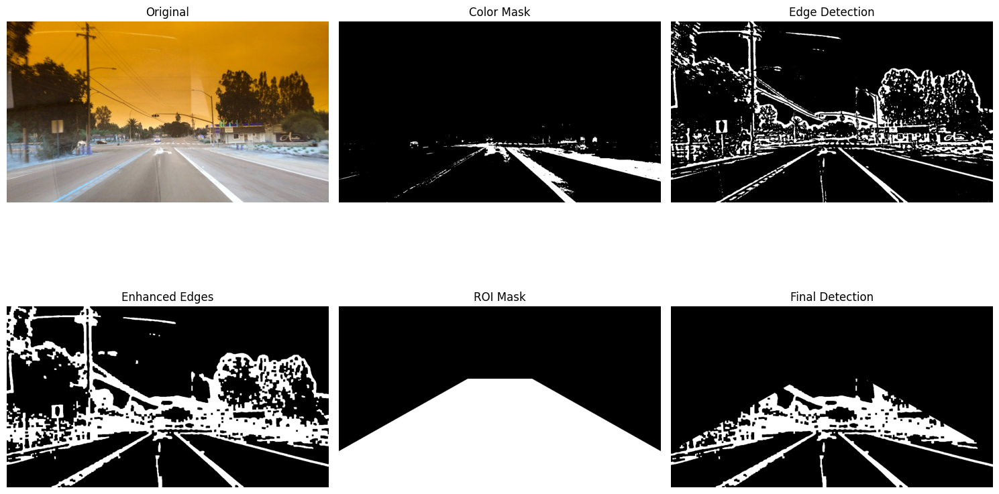

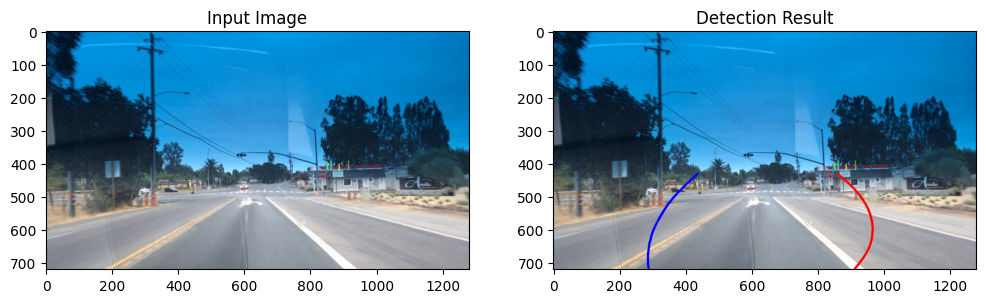

In [97]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

class LaneDetector:
    def __init__(self, image_path):
        self.image_path = image_path
        self.img = cv2.imread(image_path)
        if self.img is None:
            raise ValueError(f"无法读取图像: {image_path}")
        self.height, self.width = self.img.shape[:2]
        self._init_params()
        
    def _init_params(self):
        self.color_ranges = {
            'white': ([0, 0, 200], [255, 30, 255]),
            'yellow': ([20, 100, 100], [30, 255, 255])
        } # 车道线颜色范围
        self.morph_kernel = {
            'small': np.ones((3, 3), np.uint8),
            'medium': np.ones((5, 5), np.uint8),
            'large': np.ones((15, 15), np.uint8)
        } # 形态学处理内核
        self.roi_vertices = np.array([
            [(0, self.height), (0, self.height*0.8), (self.width*0.4, self.height*0.4), 
             (self.width*0.6, self.height*0.4), (self.width, self.height*0.8), (self.width, self.height)]
        ], dtype=np.int32) # ROI区域
        self.dog_scales = [(1.0, 2.0), (2.0, 4.0), (3.0, 6.0)] # 多尺度DoG参数
        self.roi_ratio = 0.6  # 添加缺失的roi_ratio参数
        
    def _color_segmentation(self):
        hsv = cv2.cvtColor(self.img, cv2.COLOR_BGR2HSV)
        masks = []
        for color_name, (lower, upper) in self.color_ranges.items():
            mask = cv2.inRange(hsv, np.array(lower), np.array(upper))
            masks.append(mask)
        
        if len(masks) > 0:
            combined_mask = masks[0]
            for mask in masks[1:]:
                combined_mask = cv2.bitwise_or(combined_mask, mask)
            return combined_mask
        return np.zeros((self.height, self.width), dtype=np.uint8)
    
    def _multi_scale_dog(self, gray_img):
        combined_edges = np.zeros_like(gray_img)
        for sigma1, sigma2 in self.dog_scales:
            g1 = cv2.GaussianBlur(gray_img, (0, 0), sigma1)
            g2 = cv2.GaussianBlur(gray_img, (0, 0), sigma2)
            dog = g1.astype(np.float64) - g2.astype(np.float64)
            dog_normalized = cv2.normalize(dog, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
            _, dog_binary = cv2.threshold(dog_normalized, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            combined_edges = cv2.bitwise_or(combined_edges, dog_binary)
        return combined_edges
        
    def _morphological_processing(self, edges):
        closed_edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, self.morph_kernel['medium'], iterations=2)
        opened_edges = cv2.morphologyEx(closed_edges, cv2.MORPH_OPEN, self.morph_kernel['small'])
        final_edges = cv2.dilate(opened_edges, self.morph_kernel['small'], iterations=1)
        return final_edges
        
    def _roi_mask(self, edges):
        roi_mask = np.zeros_like(edges)
        cv2.fillPoly(roi_mask, self.roi_vertices, 255)
        return cv2.bitwise_and(edges, roi_mask)
        
    def _lane_fitting(self, edges):
        points = np.argwhere(edges > 0)
        if len(points) < 10:  # 最小点数阈值
            return None, None

        # 左右车道线分离
        left_pts = points[points[:,1] < self.width//2]
        right_pts = points[points[:,1] >= self.width//2]

        fits = []
        for pts in [left_pts, right_pts]:
            if len(pts) > 5:
                y, x = pts[:,0], pts[:,1]
                fits.append(np.polyfit(y, x, 2))
            else:
                fits.append(None)
        return fits
    
    def visualize_processing(self, *images):
        """可视化处理流程"""
        titles = ['Original', 'Color Mask', 'Edge Detection', 
                'Enhanced Edges', 'ROI Mask', 'Final Detection']

        plt.figure(figsize=(15, 10))
        for idx, (img, title) in enumerate(zip(images, titles[:len(images)])):
            plt.subplot(2, 3, idx+1)
            if len(img.shape) == 2 or img.shape[2] == 1:
                plt.imshow(img, cmap='gray')
            else:
                plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            plt.title(title), plt.axis('off')
        plt.tight_layout()
        plt.show()
        
    def detect(self):
        """主检测流程"""
        # 处理流程
        color_mask = self._color_segmentation()
        gray = cv2.cvtColor(self.img, cv2.COLOR_BGR2GRAY)
        edges = self._multi_scale_dog(gray)
        enhanced = self._morphological_processing(edges)
        roi_edges = self._roi_mask(enhanced)

        # 可视化中间结果
        roi_vis = self._roi_mask(np.ones_like(edges) * 255)
        self.visualize_processing(
            cv2.cvtColor(self.img, cv2.COLOR_BGR2RGB), 
            color_mask, 
            edges, 
            enhanced,
            roi_vis,
            roi_edges
        )

        # 车道线拟合
        left_fit, right_fit = self._lane_fitting(roi_edges)
        return self._visualize_result(left_fit, right_fit)
        
    def _visualize_result(self, left_fit, right_fit):
        """结果可视化"""
        result = self.img.copy()
        y = np.linspace(self.height*self.roi_ratio, self.height, 20)

        for fit, color in zip([left_fit, right_fit], [(255,0,0), (0,0,255)]):
            if fit is not None:
                x = fit[0]*y**2 + fit[1]*y + fit[2]
                # 过滤掉超出图像边界的点
                valid = (x >= 0) & (x < self.width)
                if np.any(valid):
                    pts = np.vstack((x[valid], y[valid])).T.astype(np.int32)
                    cv2.polylines(result, [pts], False, color, 5)

        plt.figure(figsize=(12,6))
        plt.subplot(121), plt.imshow(cv2.cvtColor(self.img, cv2.COLOR_BGR2RGB)), plt.title('Input Image')
        plt.subplot(122), plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB)), plt.title('Detection Result')
        plt.show()
        return result
    
if __name__ == "__main__":
    detector = LaneDetector("/Users/alpha/Downloads/selfRepo/lodcp/docs/tttt.jpg")
    result = detector.detect()

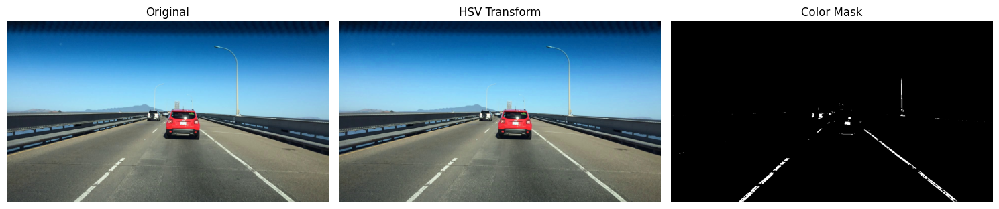

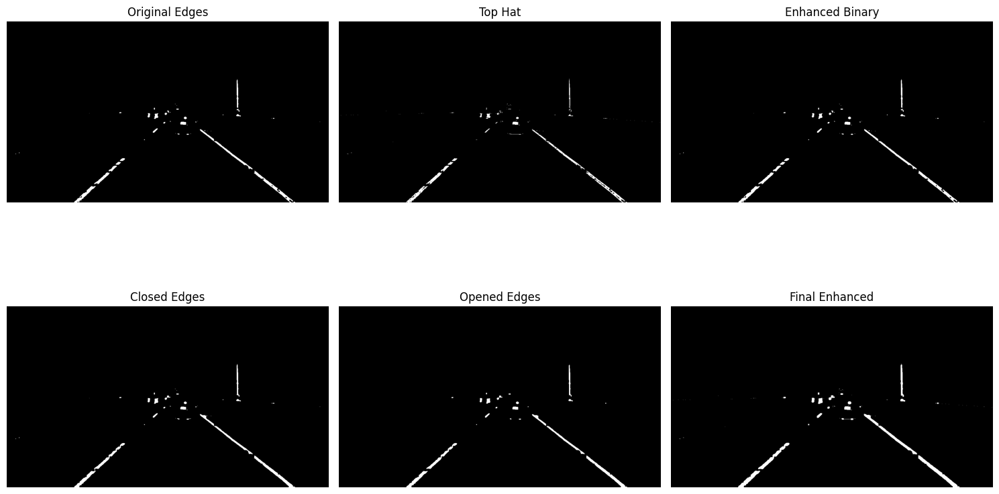

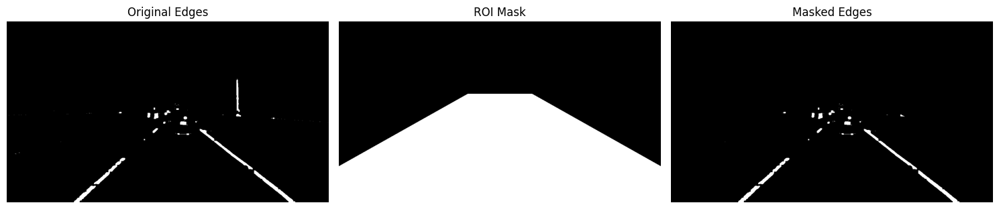

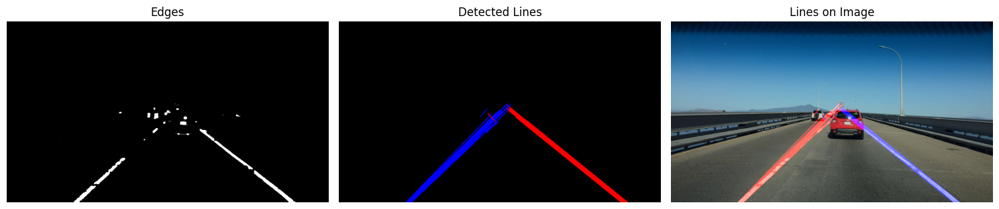

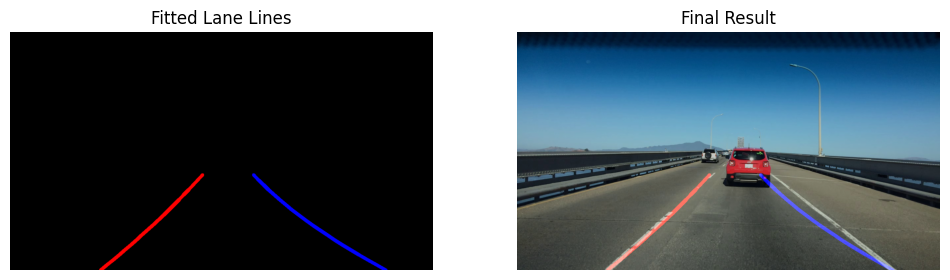

Left lane polynomial coefficients: [-6.05521932e-04 -3.69699377e-01  8.55001943e+02]
Right lane polynomial coefficients: [ 1.61143078e-03 -4.67235478e-01  6.38641540e+02]


In [108]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

class LaneDetector:
    def __init__(self, image_path):
        self.image_path = image_path
        self.img = cv2.imread(image_path)
        if self.img is None:
            raise ValueError(f"无法读取图像: {image_path}")
        self.height, self.width = self.img.shape[:2]
        self._init_params()
        
    def _init_params(self):
        # 颜色检测范围
        self.color_ranges = {
            'white': ([0, 0, 200], [255, 30, 255]),
            'yellow': ([20, 100, 100], [30, 255, 255])
        }
        
        # 形态学处理内核
        self.morph_kernel = {
            'small': np.ones((3, 3), np.uint8),
            'medium': np.ones((5, 5), np.uint8),
            'large': np.ones((15, 15), np.uint8)
        }
        
        # ROI区域参数
        self.roi_vertices = np.array([
            [(0, self.height), (0, self.height*0.8), (self.width*0.4, self.height*0.4), 
             (self.width*0.6, self.height*0.4), (self.width, self.height*0.8), (self.width, self.height)]
        ], dtype=np.int32)
        
        # 多尺度DoG参数
        self.dog_scales = [(1.0, 2.0), (2.0, 4.0), (3.0, 6.0)]
        
        # ROI比例
        self.roi_ratio = 0.6
        
        # 霍夫变换参数
        self.hough_params = {
            'rho': 1,
            'theta': np.pi/180,
            'threshold': 20,
            'minLineLength': 20,
            'maxLineGap': 300
        }
        
        # 调试模式
        self.debug = True

    def _color_segmentation(self):
        """颜色分割，提取黄色和白色区域"""
        hsv = cv2.cvtColor(self.img, cv2.COLOR_BGR2HSV)
        
        # 创建白色和黄色掩码
        masks = []
        for color_name, (lower, upper) in self.color_ranges.items():
            mask = cv2.inRange(hsv, np.array(lower), np.array(upper))
            masks.append(mask)
        
        # 合并掩码
        if len(masks) > 0:
            combined_mask = masks[0]
            for mask in masks[1:]:
                combined_mask = cv2.bitwise_or(combined_mask, mask)
            
            # 可视化
            if self.debug:
                self._debug_show([
                    cv2.cvtColor(self.img, cv2.COLOR_BGR2RGB),
                    cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB),
                    combined_mask
                ], ['Original', 'HSV Transform', 'Color Mask'])
                
            return combined_mask
        return np.zeros((self.height, self.width), dtype=np.uint8)

    def _multi_scale_dog(self, gray_img):
        """多尺度高斯差分边缘检测"""
        combined_edges = np.zeros_like(gray_img)
        scale_results = []
        
        # 对每对sigma计算DoG
        for sigma1, sigma2 in self.dog_scales:
            g1 = cv2.GaussianBlur(gray_img, (0, 0), sigma1)
            g2 = cv2.GaussianBlur(gray_img, (0, 0), sigma2)
            
            # 计算差分
            dog = g1.astype(np.float64) - g2.astype(np.float64)
            
            # 归一化
            dog_normalized = cv2.normalize(dog, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
            
            # 二值化
            _, dog_binary = cv2.threshold(dog_normalized, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            
            # 保存结果
            scale_results.append((dog_normalized, dog_binary))
            
            # 融合到最终结果
            combined_edges = cv2.bitwise_or(combined_edges, dog_binary)
        
        # 可视化
        # if self.debug and len(scale_results) > 0:
        #     rows = len(self.dog_scales)
        #     plt.figure(figsize=(12, 4*rows))
            
        #     for i, ((sigma1, sigma2), (dog_norm, dog_bin)) in enumerate(zip(self.dog_scales, scale_results)):
        #         plt.subplot(rows, 2, i*2+1)
        #         plt.title(f'DoG Scale {i+1} (σ1={sigma1}, σ2={sigma2})')
        #         plt.imshow(dog_norm, cmap='gray')
        #         plt.axis('off')
                
        #         plt.subplot(rows, 2, i*2+2)
        #         plt.title(f'Binary Edges Scale {i+1}')
        #         plt.imshow(dog_bin, cmap='gray')
        #         plt.axis('off')
            
        #     plt.tight_layout()
        #     plt.show()
            
        #     plt.figure(figsize=(8, 6))
        #     plt.title('Combined Multi-scale DoG Edges')
        #     plt.imshow(combined_edges, cmap='gray')
        #     plt.axis('off')
        #     plt.show()
        
        return combined_edges

    def _enhance_edges(self, edges, gray):
        """增强边缘细节，结合顶帽变换和形态学处理"""
        # 应用顶帽运算提取亮细节
        tophat = cv2.morphologyEx(gray, cv2.MORPH_TOPHAT, self.morph_kernel['large'])
        
        # 增强边缘对比度并二值化
        _, enhanced_edges = cv2.threshold(edges, 100, 255, cv2.THRESH_BINARY)
        
        # 应用闭运算连接断开的线
        closed_edges = cv2.morphologyEx(enhanced_edges, cv2.MORPH_CLOSE, self.morph_kernel['medium'], iterations=2)
        
        # 应用开运算去除噪点
        opened_edges = cv2.morphologyEx(closed_edges, cv2.MORPH_OPEN, self.morph_kernel['small'])
        
        # 最后再膨胀一次完善车道线
        final_edges = cv2.dilate(opened_edges, self.morph_kernel['small'], iterations=1)
        
        # 结合原始边缘和顶帽结果
        _, tophat_binary = cv2.threshold(tophat, 30, 255, cv2.THRESH_BINARY)
        combined_edges = cv2.bitwise_or(final_edges, tophat_binary)
        
        # 可视化
        if self.debug:
            self._debug_show([
                edges,
                tophat,
                enhanced_edges,
                closed_edges,
                opened_edges,
                combined_edges
            ], ['Original Edges', 'Top Hat', 'Enhanced Binary', 
                'Closed Edges', 'Opened Edges', 'Final Enhanced'])
        
        return combined_edges

    def _roi_mask(self, edges):
        """应用感兴趣区域掩码"""
        roi_mask = np.zeros_like(edges)
        cv2.fillPoly(roi_mask, self.roi_vertices, 255)
        
        # 应用掩码
        masked_edges = cv2.bitwise_and(edges, roi_mask)
        
        # 可视化
        if self.debug:
            self._debug_show([edges, roi_mask, masked_edges], 
                           ['Original Edges', 'ROI Mask', 'Masked Edges'])
        
        return masked_edges

    def _detect_lines(self, edges):
        """使用霍夫变换检测直线"""
        lines = cv2.HoughLinesP(
            edges,
            rho=self.hough_params['rho'],
            theta=self.hough_params['theta'],
            threshold=self.hough_params['threshold'],
            minLineLength=self.hough_params['minLineLength'],
            maxLineGap=self.hough_params['maxLineGap']
        )
        
        # 绘制检测到的线
        line_img = cv2.cvtColor(np.zeros_like(edges), cv2.COLOR_GRAY2BGR)
        
        # 分离左右车道线
        left_lines = []
        right_lines = []
        
        if lines is not None:
            for line in lines:
                x1, y1, x2, y2 = line[0]
                
                # 计算斜率
                if x2 - x1 == 0:
                    continue
                    
                slope = (y2 - y1) / (x2 - x1)
                
                # 过滤掉接近水平的线(噪声)
                if abs(slope) < 0.4:
                    continue
                    
                # 根据斜率划分左右车道线
                if slope < 0:  # 负斜率为左车道线
                    left_lines.append(line)
                    cv2.line(line_img, (x1, y1), (x2, y2), (255, 0, 0), 2)
                else:  # 正斜率为右车道线
                    right_lines.append(line)
                    cv2.line(line_img, (x1, y1), (x2, y2), (0, 0, 255), 2)
        
        # 可视化
        if self.debug:
            original_rgb = cv2.cvtColor(self.img, cv2.COLOR_BGR2RGB)
            result_img = cv2.addWeighted(original_rgb, 0.8, line_img, 1, 0)
            self._debug_show([edges, line_img, result_img], 
                           ['Edges', 'Detected Lines', 'Lines on Image'])
        
        return left_lines, right_lines, line_img

    def _fit_lane_lines(self, left_lines, right_lines):
        """拟合车道线"""
        def fit_line(lines):
            if not lines:
                return None
                
            # 提取所有点
            points = np.array([])
            for line in lines:
                x1, y1, x2, y2 = line[0]
                points = np.append(points, [x1, y1, x2, y2])
                
            points = points.reshape(-1, 2)
            
            # 多项式拟合 (二次)
            if len(points) > 0:
                y = points[:, 1]
                x = points[:, 0]
                fit = np.polyfit(y, x, 2)
                return fit
            return None
        
        left_fit = fit_line(left_lines)
        right_fit = fit_line(right_lines)
        
        return left_fit, right_fit

    def _visualize_result(self, left_fit, right_fit):
        """可视化车道线检测结果"""
        result = cv2.cvtColor(self.img, cv2.COLOR_BGR2RGB).copy()
        lane_img = np.zeros_like(result)
        
        # 绘制车道线
        y_points = np.linspace(self.height*self.roi_ratio, self.height, num=20)
        
        if left_fit is not None:
            x_points = left_fit[0]*y_points**2 + left_fit[1]*y_points + left_fit[2]
            # 过滤掉超出边界的点
            valid_indices = (x_points >= 0) & (x_points < self.width)
            if np.any(valid_indices):
                pts = np.vstack((x_points[valid_indices], y_points[valid_indices])).T.astype(np.int32)
                cv2.polylines(lane_img, [pts], False, (255, 0, 0), 10)
        
        if right_fit is not None:
            x_points = right_fit[0]*y_points**2 + right_fit[1]*y_points + right_fit[2]
            # 过滤掉超出边界的点
            valid_indices = (x_points >= 0) & (x_points < self.width)
            if np.any(valid_indices):
                pts = np.vstack((x_points[valid_indices], y_points[valid_indices])).T.astype(np.int32)
                cv2.polylines(lane_img, [pts], False, (0, 0, 255), 10)
        
        # 叠加车道线到原始图像
        result = cv2.addWeighted(result, 0.8, lane_img, 1, 0)
        
        # 显示结果
        if self.debug:
            plt.figure(figsize=(12, 6))
            plt.subplot(1, 2, 1)
            plt.title('Fitted Lane Lines')
            plt.imshow(lane_img)
            plt.axis('off')
            
            plt.subplot(1, 2, 2)
            plt.title('Final Result')
            plt.imshow(result)
            plt.axis('off')
            plt.show()
        
        return result, lane_img

    def _debug_show(self, images, titles):
        """调试显示函数"""
        if not self.debug:
            return
            
        cols = min(3, len(images))
        rows = (len(images) + cols - 1) // cols
        
        plt.figure(figsize=(15, 5*rows))
        for i, (img, title) in enumerate(zip(images, titles)):
            plt.subplot(rows, cols, i+1)
            
            # 根据图像类型选择显示方式
            if len(img.shape) == 2 or img.shape[2] == 1:
                plt.imshow(img, cmap='gray')
            else:
                # 确保BGR格式转换为RGB
                if img.shape[2] == 3 and np.max(img) > 1:
                    img_show = img
                    if img_show.dtype != np.float32 and img_show.dtype != np.float64:
                        # 检查是否已经是RGB格式
                        b, g, r = cv2.split(img_show)
                        if np.mean(b) > np.mean(r):
                            img_show = cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB)
                    plt.imshow(img_show)
                else:
                    plt.imshow(img)
            
            plt.title(title)
            plt.axis('off')
        
        plt.tight_layout()
        plt.show()

    def detect(self):
        """车道线检测主流程"""
        # 1. 基于颜色的分割
        color_mask = self._color_segmentation()
        
        # 2. 转换为灰度图
        mask_rgb = cv2.cvtColor(color_mask, cv2.COLOR_GRAY2BGR)
        gray = cv2.cvtColor(mask_rgb, cv2.COLOR_BGR2GRAY)
        
        # 3. 多尺度DoG边缘检测
        edges = self._multi_scale_dog(gray)
        edges = cv2.medianBlur(edges, 3)
        
        # 4. 增强边缘
        enhanced_edges = self._enhance_edges(edges, gray)
        
        # 5. 应用ROI掩码
        roi_edges = self._roi_mask(enhanced_edges)
        
        # 6. 霍夫变换检测直线
        left_lines, right_lines, line_img = self._detect_lines(roi_edges)
        
        # 7. 拟合车道线
        left_fit, right_fit = self._fit_lane_lines(left_lines, right_lines)
        
        # 8. 可视化结果
        result, lane_img = self._visualize_result(left_fit, right_fit)
        
        return result, left_fit, right_fit

if __name__ == "__main__":
    # 替换为你的图像路径
    image_path = "/Users/alpha/Downloads/selfRepo/lodcp/docs/ttt.jpg"
    
    detector = LaneDetector(image_path)
    result, left_fit, right_fit = detector.detect()
    
    if left_fit is not None:
        print("Left lane polynomial coefficients:", left_fit)
    if right_fit is not None:
        print("Right lane polynomial coefficients:", right_fit)

# Chapter 3

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

class LaneDetector:
    def __init__(self, image_path):
        self.image_path = image_path
        self.img = cv2.imread(image_path)
        if self.img is None:
            raise ValueError(f"无法读取图像: {image_path}")
        self.height, self.width = self.img.shape[:2]
        self._init_params()
        
        # 保存每个步骤的处理前后图像
        self.step_images = []
        
    def _init_params(self):
        # 颜色检测范围
        self.color_ranges = {
            'white': ([0, 0, 200], [255, 30, 255]),
            'yellow': ([20, 100, 100], [30, 255, 255])
        }
        
        # 形态学处理内核
        self.morph_kernel = {
            'small': np.ones((3, 3), np.uint8),
            'medium': np.ones((5, 5), np.uint8),
            'large': np.ones((15, 15), np.uint8)
        }
        
        # ROI区域参数
        self.roi_vertices = np.array([
            [(0, self.height), (0, self.height*0.8), (self.width*0.4, self.height*0.4), 
             (self.width*0.6, self.height*0.4), (self.width, self.height*0.8), (self.width, self.height)]
        ], dtype=np.int32)
        
        # 多尺度DoG参数
        self.dog_scales = [(1.0, 2.0), (2.0, 4.0), (3.0, 6.0)]
        
        # ROI比例
        self.roi_ratio = 0.6
        
        # 霍夫变换参数
        self.hough_params = {
            'rho': 1,
            'theta': np.pi/180,
            'threshold': 20,
            'minLineLength': 20,
            'maxLineGap': 300
        }
        
        # 调试模式
        self.debug = False

    def _color_segmentation(self):
        """颜色分割，提取黄色和白色区域"""
        # 保存原始图像
        original_img = cv2.cvtColor(self.img.copy(), cv2.COLOR_BGR2RGB)
        
        hsv = cv2.cvtColor(self.img, cv2.COLOR_BGR2HSV)
        
        # 创建白色和黄色掩码
        masks = []
        for color_name, (lower, upper) in self.color_ranges.items():
            mask = cv2.inRange(hsv, np.array(lower), np.array(upper))
            masks.append(mask)
        
        # 合并掩码
        if len(masks) > 0:
            combined_mask = masks[0]
            for mask in masks[1:]:
                combined_mask = cv2.bitwise_or(combined_mask, mask)
            
            # 生成对比图
            # 将掩码转为3通道便于显示
            mask_rgb = cv2.cvtColor(combined_mask, cv2.COLOR_GRAY2RGB)
            self.step_images.append((original_img, mask_rgb))
                
            return combined_mask
        return np.zeros((self.height, self.width), dtype=np.uint8)

    def _multi_scale_dog(self, gray_img):
        """多尺度高斯差分边缘检测"""
        # 保存输入图像
        input_img = cv2.cvtColor(gray_img.copy(), cv2.COLOR_GRAY2RGB)
        
        combined_edges = np.zeros_like(gray_img)
        
        # 对每对sigma计算DoG
        for sigma1, sigma2 in self.dog_scales:
            g1 = cv2.GaussianBlur(gray_img, (0, 0), sigma1)
            g2 = cv2.GaussianBlur(gray_img, (0, 0), sigma2)
            
            # 计算差分
            dog = g1.astype(np.float64) - g2.astype(np.float64)
            
            # 归一化
            dog_normalized = cv2.normalize(dog, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
            
            # 二值化
            _, dog_binary = cv2.threshold(dog_normalized, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
            
            # 融合到最终结果
            combined_edges = cv2.bitwise_or(combined_edges, dog_binary)
        
        # 应用中值滤波去除噪声
        edges = cv2.medianBlur(combined_edges, 3)
        
        # 生成对比图
        edges_rgb = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)
        self.step_images.append((input_img, edges_rgb))
        
        return edges

    def _enhance_edges(self, edges, gray):
        """增强边缘细节，结合顶帽变换和形态学处理"""
        # 保存输入边缘图
        input_edges_rgb = cv2.cvtColor(edges.copy(), cv2.COLOR_GRAY2RGB)
        
        # 应用顶帽运算提取亮细节
        tophat = cv2.morphologyEx(gray, cv2.MORPH_TOPHAT, self.morph_kernel['large'])
        
        # 增强边缘对比度并二值化
        _, enhanced_edges = cv2.threshold(edges, 100, 255, cv2.THRESH_BINARY)
        
        # 应用闭运算连接断开的线
        closed_edges = cv2.morphologyEx(enhanced_edges, cv2.MORPH_CLOSE, self.morph_kernel['medium'], iterations=2)
        
        # 应用开运算去除噪点
        opened_edges = cv2.morphologyEx(closed_edges, cv2.MORPH_OPEN, self.morph_kernel['small'])
        
        # 最后再膨胀一次完善车道线
        final_edges = cv2.dilate(opened_edges, self.morph_kernel['small'], iterations=1)
        
        # 结合原始边缘和顶帽结果
        _, tophat_binary = cv2.threshold(tophat, 30, 255, cv2.THRESH_BINARY)
        combined_edges = cv2.bitwise_or(final_edges, tophat_binary)
        
        # 生成对比图
        enhanced_edges_rgb = cv2.cvtColor(combined_edges, cv2.COLOR_GRAY2RGB)
        self.step_images.append((input_edges_rgb, enhanced_edges_rgb))
        
        return combined_edges

    def _roi_mask(self, edges):
        """应用感兴趣区域掩码"""
        # 保存输入边缘图
        input_edges_rgb = cv2.cvtColor(edges.copy(), cv2.COLOR_GRAY2RGB)
        
        # 创建ROI掩码
        roi_mask = np.zeros_like(edges)
        cv2.fillPoly(roi_mask, self.roi_vertices, 255)
        
        # 应用掩码
        masked_edges = cv2.bitwise_and(edges, roi_mask)
        
        # 生成对比图
        masked_edges_rgb = cv2.cvtColor(masked_edges, cv2.COLOR_GRAY2RGB)
        self.step_images.append((input_edges_rgb, masked_edges_rgb))
        
        return masked_edges

    def _detect_lines(self, edges):
        """使用霍夫变换检测直线"""
        # 保存输入边缘图
        input_edges_rgb = cv2.cvtColor(edges.copy(), cv2.COLOR_GRAY2RGB)
        
        lines = cv2.HoughLinesP(
            edges,
            rho=self.hough_params['rho'],
            theta=self.hough_params['theta'],
            threshold=self.hough_params['threshold'],
            minLineLength=self.hough_params['minLineLength'],
            maxLineGap=self.hough_params['maxLineGap']
        )
        
        # 绘制检测到的线
        line_img = cv2.cvtColor(np.zeros_like(edges), cv2.COLOR_GRAY2BGR)
        
        # 分离左右车道线
        left_lines = []
        right_lines = []
        
        if lines is not None:
            for line in lines:
                x1, y1, x2, y2 = line[0]
                
                # 计算斜率
                if x2 - x1 == 0:
                    continue
                    
                slope = (y2 - y1) / (x2 - x1)
                
                # 过滤掉接近水平的线(噪声)
                if abs(slope) < 0.4:
                    continue
                    
                # 根据斜率划分左右车道线
                if slope < 0:  # 负斜率为左车道线
                    left_lines.append(line)
                    cv2.line(line_img, (x1, y1), (x2, y2), (255, 0, 0), 2)
                else:  # 正斜率为右车道线
                    right_lines.append(line)
                    cv2.line(line_img, (x1, y1), (x2, y2), (0, 0, 255), 2)
        
        # 生成对比图（输入边缘图和检测到的线）
        self.step_images.append((input_edges_rgb, line_img))
        
        return left_lines, right_lines, line_img

    def _fit_lane_lines(self, left_lines, right_lines):
        """拟合车道线"""
        # 创建线段图像用于对比
        line_img = np.zeros((self.height, self.width, 3), dtype=np.uint8)
        
        # 绘制原始线段
        if left_lines:
            for line in left_lines:
                x1, y1, x2, y2 = line[0]
                cv2.line(line_img, (x1, y1), (x2, y2), (255, 0, 0), 2)
        
        if right_lines:
            for line in right_lines:
                x1, y1, x2, y2 = line[0]
                cv2.line(line_img, (x1, y1), (x2, y2), (0, 0, 255), 2)
        
        def fit_line(lines):
            if not lines:
                return None
                
            # 提取所有点
            points = np.array([])
            for line in lines:
                x1, y1, x2, y2 = line[0]
                points = np.append(points, [x1, y1, x2, y2])
                
            points = points.reshape(-1, 2)
            
            # 多项式拟合 (二次)
            if len(points) > 0:
                y = points[:, 1]
                x = points[:, 0]
                fit = np.polyfit(y, x, 2)
                return fit
            return None
        
        left_fit = fit_line(left_lines)
        right_fit = fit_line(right_lines)
        
        # 创建拟合曲线图像
        fit_img = np.zeros_like(line_img)
        
        # 绘制拟合曲线
        y_points = np.linspace(self.height*self.roi_ratio, self.height, num=100)
        
        if left_fit is not None:
            x_points = left_fit[0]*y_points**2 + left_fit[1]*y_points + left_fit[2]
            valid_indices = (x_points >= 0) & (x_points < self.width)
            if np.any(valid_indices):
                pts = np.vstack((x_points[valid_indices], y_points[valid_indices])).T.astype(np.int32)
                cv2.polylines(fit_img, [pts], False, (255, 0, 0), 3)
        
        if right_fit is not None:
            x_points = right_fit[0]*y_points**2 + right_fit[1]*y_points + right_fit[2]
            valid_indices = (x_points >= 0) & (x_points < self.width)
            if np.any(valid_indices):
                pts = np.vstack((x_points[valid_indices], y_points[valid_indices])).T.astype(np.int32)
                cv2.polylines(fit_img, [pts], False, (0, 0, 255), 3)
        
        # 生成对比图（线段和拟合曲线）
        self.step_images.append((line_img, fit_img))
        
        return left_fit, right_fit

    def _visualize_result(self, left_fit, right_fit):
        """可视化车道线检测结果"""
        # 原始图像
        original_img = cv2.cvtColor(self.img, cv2.COLOR_BGR2RGB).copy()
        
        # 结果图像（车道线叠加）
        result = original_img.copy()
        lane_img = np.zeros_like(result)
        
        # 绘制车道线
        y_points = np.linspace(self.height*self.roi_ratio, self.height, num=20)
        
        if left_fit is not None:
            x_points = left_fit[0]*y_points**2 + left_fit[1]*y_points + left_fit[2]
            # 过滤掉超出边界的点
            valid_indices = (x_points >= 0) & (x_points < self.width)
            if np.any(valid_indices):
                pts = np.vstack((x_points[valid_indices], y_points[valid_indices])).T.astype(np.int32)
                cv2.polylines(lane_img, [pts], False, (255, 0, 0), 10)
        
        if right_fit is not None:
            x_points = right_fit[0]*y_points**2 + right_fit[1]*y_points + right_fit[2]
            # 过滤掉超出边界的点
            valid_indices = (x_points >= 0) & (x_points < self.width)
            if np.any(valid_indices):
                pts = np.vstack((x_points[valid_indices], y_points[valid_indices])).T.astype(np.int32)
                cv2.polylines(lane_img, [pts], False, (0, 0, 255), 10)
        
        # 叠加车道线到原始图像
        result = cv2.addWeighted(result, 0.8, lane_img, 1, 0)
        
        # 生成对比图（原始图像和结果图像）
        self.step_images.append((original_img, result))
        
        return result, lane_img

    def detect(self):
        """车道线检测主流程"""
        # 1. 基于颜色的分割
        color_mask = self._color_segmentation()
        
        # 2. 转换为灰度图
        mask_rgb = cv2.cvtColor(color_mask, cv2.COLOR_GRAY2BGR)
        gray = cv2.cvtColor(mask_rgb, cv2.COLOR_BGR2GRAY)

        # 3. 多尺度DoG边缘检测
        edges = self._multi_scale_dog(gray)
        
        # 4. 增强边缘pro
        enhanced_edges = self._enhance_edges(edges, gray)
        
        # 5. 应用ROI掩码
        roi_edges = self._roi_mask(enhanced_edges)
        
        # 6. 霍夫变换检测直线
        left_lines, right_lines, line_img = self._detect_lines(roi_edges)
        
        # 7. 拟合车道线
        left_fit, right_fit = self._fit_lane_lines(left_lines, right_lines)
        
        # 8. 可视化结果
        result, lane_img = self._visualize_result(left_fit, right_fit)
        
        # 输出七个步骤的对比图
        self._save_step_comparison()
        
        return result, left_fit, right_fit
    
    def _save_step_comparison(self):
        """保存每个处理步骤的前后对比图"""
        step_names = [
            "1_color_segmentation",
            "2_dog_edge_detection",
            "3_edge_enhancement",
            "4_roi_masking",
            "5_line_detection",
            "6_lane_fitting",
            "7_final_result"
        ]
        
        # 创建7个图形，每个图形显示一个步骤的前后对比
        for i, ((before, after), step_name) in enumerate(zip(self.step_images, step_names)):
            plt.figure(figsize=(12, 5))
            
            # 左侧：处理前
            plt.subplot(1, 2, 1)
            plt.imshow(before)
            plt.axis('off')
            
            # 右侧：处理后
            plt.subplot(1, 2, 2)
            plt.imshow(after)
            plt.axis('off')
            
            plt.tight_layout()
            plt.savefig(f"{step_name}.png", bbox_inches='tight')
            plt.close()

if __name__ == "__main__":
    # 替换为你的图像路径
    image_path = "/Users/alpha/Downloads/selfRepo/lodcp/docs/ttt.jpg"
    
    detector = LaneDetector(image_path)
    result, left_fit, right_fit = detector.detect()

In [111]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def create_roi_comparison(image_path, save_path="roi_comparison.png"):
    """
    创建ROI对比图：左侧为原图，右侧为ROI覆盖图（白色区域半透明，黑色区域不变）
    
    参数:
    image_path: 输入图像路径
    save_path: 保存图像路径
    """
    # 读取图像
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"无法读取图像: {image_path}")
    
    # 转换为RGB格式
    original_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    height, width = original_img.shape[:2]
    
    # 定义ROI顶点
    roi_vertices = np.array([
        [(0, height), 
         (0, height*0.8), 
         (width*0.4, height*0.4), 
         (width*0.6, height*0.4), 
         (width, height*0.8), 
         (width, height)]
    ], dtype=np.int32)
    
    # 创建黑色背景图像
    roi_mask = np.zeros((height, width), dtype=np.uint8)
    
    # 在黑色背景上绘制白色ROI区域
    cv2.fillPoly(roi_mask, roi_vertices, 255)
    
    # 创建ROI覆盖图像
    overlay_img = original_img.copy()
    
    # 只处理白色掩码区域，使其半透明
    roi_area = (roi_mask == 255)
    non_roi_area = (roi_mask == 0)
    
    # 白色ROI区域半透明化（增加亮度和蓝色色调）
    overlay_img[roi_area] = (original_img[roi_area] * 0.7 + np.array([100, 100, 200]) * 0.3).astype(np.uint8)
    
    # 绘制ROI区域边界线
    cv2.polylines(overlay_img, roi_vertices, True, (255, 255, 255), 2)
    
    # 创建对比图（左侧原图，右侧ROI覆盖图）
    plt.figure(figsize=(16, 8))
    
    # 左侧：原始图像
    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.axis('off')
    
    # 右侧：ROI覆盖图
    plt.subplot(1, 2, 2)
    plt.imshow(overlay_img)
    plt.axis('off')
    
    plt.tight_layout()
    plt.savefig(save_path, bbox_inches='tight')
    plt.close()
    
    return original_img, overlay_img

if __name__ == "__main__":
    # 替换为你的图像路径
    image_path = "/Users/alpha/Downloads/selfRepo/lodcp/docs/ttt.jpg"
    
    # 创建并保存ROI对比图
    original, overlay = create_roi_comparison(image_path)
    print(f"ROI对比图已保存为 roi_comparison.png")

ROI对比图已保存为 roi_comparison.png


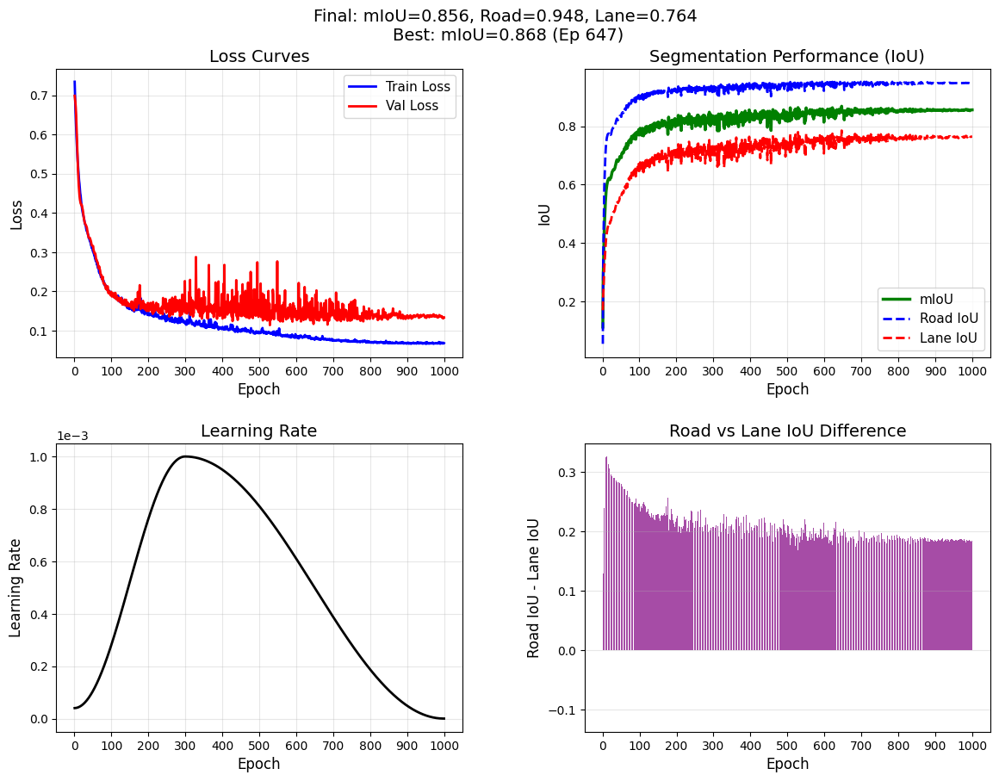

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 读取训练日志
data = pd.read_csv("/Users/alpha/Downloads/lodcp/models/fastscnn/training_log.csv")

# 创建四个关键图表的布局
fig, axes = plt.subplots(2, 2, figsize=(14, 10), dpi=100)
plt.subplots_adjust(hspace=0.3, wspace=0.3)

# 1. 训练和验证损失
ax1 = axes[0, 0]
ax1.plot(data['Epoch'], data['Train Loss'], 'b-', label='Train Loss', linewidth=2)
ax1.plot(data['Epoch'], data['Val Loss'], 'r-', label='Val Loss', linewidth=2)
ax1.set_title('Loss Curves', fontsize=14)
ax1.set_xlabel('Epoch', fontsize=12)
ax1.set_ylabel('Loss', fontsize=12)
ax1.legend(fontsize=11)
ax1.grid(True, alpha=0.3)

# 2. mIoU和类别IoU
ax2 = axes[0, 1]
ax2.plot(data['Epoch'], data['mIoU'], 'g-', label='mIoU', linewidth=2.5)
ax2.plot(data['Epoch'], data['Road IoU'], 'b--', label='Road IoU', linewidth=2)
ax2.plot(data['Epoch'], data['Lane IoU'], 'r--', label='Lane IoU', linewidth=2)
ax2.set_title('Segmentation Performance (IoU)', fontsize=14)
ax2.set_xlabel('Epoch', fontsize=12)
ax2.set_ylabel('IoU', fontsize=12)
ax2.legend(fontsize=11)
ax2.grid(True, alpha=0.3)

# 3. 学习率
ax3 = axes[1, 0]
ax3.plot(data['Epoch'], data['Learning Rate'], 'k-', linewidth=2)
ax3.set_title('Learning Rate', fontsize=14)
ax3.set_xlabel('Epoch', fontsize=12)
ax3.set_ylabel('Learning Rate', fontsize=12)
ax3.ticklabel_format(axis='y', style='sci', scilimits=(0,0))
ax3.grid(True, alpha=0.3)

# 4. IoU类别差异
ax4 = axes[1, 1]
iou_gap = data['Road IoU'] - data['Lane IoU']
ax4.bar(data['Epoch'], iou_gap, color='purple', alpha=0.7)
ax4.set_title('Road vs Lane IoU Difference', fontsize=14)
ax4.set_xlabel('Epoch', fontsize=12)
ax4.set_ylabel('Road IoU - Lane IoU', fontsize=12)
ax4.grid(True, axis='y', alpha=0.3)

# 如果训练周期很多，调整x轴刻度
for ax in axes.flat:
    if len(data) > 20:
        interval = max(1, len(data) // 10)  # 最多显示约10个标签
        ticks = np.arange(0, len(data)+1, interval)
        ax.set_xticks(ticks)
fig.suptitle(
    f"Final: mIoU={data['mIoU'].iloc[-1]:.3f}, Road={data['Road IoU'].iloc[-1]:.3f}, Lane={data['Lane IoU'].iloc[-1]:.3f} \n"
    f"Best: mIoU={data['mIoU'].max():.3f} (Ep {data['mIoU'].idxmax()+1})",
    fontsize=14,
    y=0.95
)

# 添加简洁的摘要信息
plt.figtext(
    0.5, -0.05,  # x and y position of the text box
    "",
    wrap=True,
    horizontalalignment='center',
    fontsize=12,
    bbox={"facecolor": "#E0E0E0", "alpha": 0.7, "boxstyle": "round,pad=0.5"}
)

plt.savefig('fastscnn_training_analysis.png', dpi=300, bbox_inches='tight')
plt.show()